In [6]:
import os
import sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torch.nn.functional as F
import torchvision.transforms as transforms
import torchvision.datasets as dset
import torchvision.utils as vutils
import matplotlib.pyplot as plt
from torch.autograd import Variable
import cv2

BATCH_SIZE = 4
IMAGE_CHANNEL = 3
Z_DIM = 100
G_HIDDEN = 64
X_DIM = 64
D_HIDDEN = 64
EPOCH_NUM = 2000
REAL_LABEL = 1
FAKE_LABEL = 0
lr = 0.001
seed = 1

CUDA = torch.cuda.is_available()
print(f"PyTorch version: {torch.__version__}")
if CUDA:
    print(f"CUDA version: {torch.version.cuda}\n")

torch.cuda.manual_seed(seed)

device = torch.device("cuda" if CUDA else "cpu")
cudnn.benchmark = True 

PyTorch version: 2.1.2
CUDA version: 12.1



In [7]:
def display_data(dataloader,str):
    # Plot some training images
    Data=next(iter(dataloader))
    #print(Data)
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"{str} Images")
    plt.imshow(np.transpose(vutils.make_grid(Data.to(device), nrow=4, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.show() 

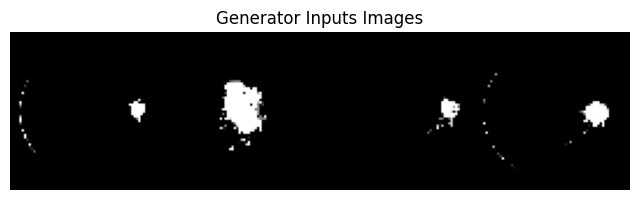

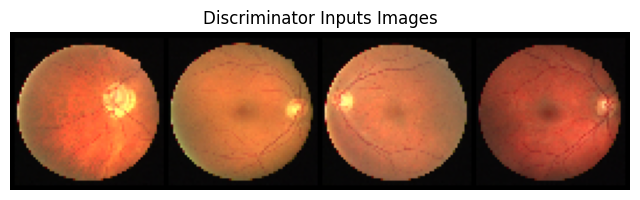

In [8]:
#Dataset for Generator Input Images
transform = transforms.Compose([transforms.ToTensor()])
class vector_Dataset():
    def __init__(self,transform=None):
        self.files=os.listdir('/kaggle/input/gan-major-study-dataset/GAN_Inputs/optic')
        #print(self.files)
        self.file_name=[]
        for file in self.files:
            basename, extension = os.path.splitext(file)
            self.file_name.append(basename)
            
    def __len__(self):
        return(len(self.files))
    
    def __getitem__(self,idx):
        optic=cv2.imread(f'/kaggle/input/gan-major-study-dataset/GAN_Inputs/optic/{self.file_name[idx]}.jpg')
        optic=cv2.resize(optic,(64,64))
        optic=cv2.cvtColor(optic, cv2.COLOR_BGR2GRAY)
        plt.imshow(optic)
        plt.show()
        optic=transform(optic)#.to(device)
        
        return optic

in_dataset=vector_Dataset()

# Dataloader for Generator Input Images
G_inputs = torch.utils.data.DataLoader(in_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)  

#Show Training Images
display_data(G_inputs,'Generator Inputs')

#Dataset for Real Images
transform = transforms.Compose([transforms.ToTensor()])
class training_Dataset():
    def __init__(self,transform=None):
        root_dir=r'/kaggle/input/gan-major-study-dataset/GAN_Inputs/original'
        self.image_paths = [os.path.join(root_dir, img) for img in os.listdir(root_dir)]
            
    def __len__(self):
        return(len(self.image_paths))
    
    def __getitem__(self,idx):
        optic=cv2.imread(self.image_paths[idx])
        optic=cv2.resize(optic,(64,64))
        optic=cv2.cvtColor(optic, cv2.COLOR_BGR2RGB)
        optic=transform(optic)#.to(device)
        
        return optic

train_dataset=training_Dataset()

# Dataloader for Real Images
D_inputs = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)

#Show Training Images
display_data(D_inputs,'Discriminator Inputs')

In [9]:
def normal_init(m, mean, std):
    if isinstance(m, nn.ConvTranspose2d) or isinstance(m, nn.Conv2d):
        m.weight.data.normal_(mean, std)
        m.bias.data.zero_()

class downsampler(nn.Module):
    # initializers
    def __init__(self, d=4):
        super(downsampler, self).__init__()
        self.conv1 = nn.Conv2d(1, d,kernel_size=33, stride=1, padding=0)
        self.conv1_bn = nn.BatchNorm2d(d)
        self.conv2 = nn.Conv2d(d, d*2,kernel_size=17, stride=1, padding=0)
        self.conv2_bn = nn.BatchNorm2d(d*2)
        self.conv3 = nn.Conv2d(d*2, d*4,kernel_size=9, stride=1, padding=0)
        self.conv3_bn = nn.BatchNorm2d(d*4)
        self.conv4 = nn.Conv2d(d*4, d*8,kernel_size=8, stride=1, padding=0)
        #self.conv4_bn = nn.BatchNorm2d(d*8)
        self.linear=nn.Linear(32,100).to(device)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, input):
        x = F.leaky_relu(self.conv1_bn(self.conv1(input)), 0.2)
        print('shape after Layer1: ',x.shape)
        x = F.leaky_relu(self.conv2_bn(self.conv2(x)), 0.2)
        print('shape after Layer2: ',x.shape)
        x = F.leaky_relu(self.conv3_bn(self.conv3(x)), 0.2)
        print('shape after Layer3: ',x.shape)
        x = self.conv4(x)
        print('shape after Layer4: ',x.shape)  
        x = self.linear(torch.flatten(x, start_dim=1))#, end_dim=2
        print('shape after Linear Layer: ',x.shape)        

        return x
    
# generator and discriminator

class generator(nn.Module):
    # initializers
    def __init__(self, d=G_HIDDEN):
        super(generator, self).__init__()
        self.deconv1 = nn.ConvTranspose2d(Z_DIM, d*8, 4, 1, 0)
        self.deconv1_bn = nn.BatchNorm2d(d*8)
        self.deconv2 = nn.ConvTranspose2d(d*8, d*4, 4, 2, 1)
        self.deconv2_bn = nn.BatchNorm2d(d*4)
        self.deconv3 = nn.ConvTranspose2d(d*4, d*2, 4, 2, 1)
        self.deconv3_bn = nn.BatchNorm2d(d*2)
        self.deconv4 = nn.ConvTranspose2d(d*2, d, 4, 2, 1)
        self.deconv4_bn = nn.BatchNorm2d(d)
        self.deconv5 = nn.ConvTranspose2d(d, 3, 4, 2, 1)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, input):
        # x = F.relu(self.deconv1(input))
        x = F.relu(self.deconv1_bn(self.deconv1(input)))
        x = F.relu(self.deconv2_bn(self.deconv2(x)))
        x = F.relu(self.deconv3_bn(self.deconv3(x)))
        x = F.relu(self.deconv4_bn(self.deconv4(x)))
        x = F.tanh(self.deconv5(x))
        #print('Generator Image final size: ',x.shape)

        return x

class discriminator(nn.Module):
    # initializers
    def __init__(self, d=D_HIDDEN):
        super(discriminator, self).__init__()
        self.conv1 = nn.Conv2d(3, d, 4, 2, 1)
        #self.conv1_bn = nn.BatchNorm2d(d)
        self.conv2 = nn.Conv2d(d, d*2, 4, 2, 1)
        self.conv2_bn = nn.BatchNorm2d(d*2)
        self.conv3 = nn.Conv2d(d*2, d*4, 4, 2, 1)
        self.conv3_bn = nn.BatchNorm2d(d*4)
        self.conv4 = nn.Conv2d(d*4, d*8, 4, 2, 1)
        self.conv4_bn = nn.BatchNorm2d(d*8)
        self.conv5 = nn.Conv2d(d*8, 1, 4, 1, 0)

    # weight_init
    def weight_init(self, mean, std):
        for m in self._modules:
            normal_init(self._modules[m], mean, std)

    # forward method
    def forward(self, input):
        x = F.leaky_relu(self.conv1(input), 0.2)
        x = F.leaky_relu(self.conv2_bn(self.conv2(x)), 0.2)
        x = F.leaky_relu(self.conv3_bn(self.conv3(x)), 0.2)
        x = F.leaky_relu(self.conv4_bn(self.conv4(x)), 0.2)
        x = F.sigmoid(self.conv5(x))
        #print('Discriminator Image size: ',x.shape)
        
        return x

In [10]:
#create Downsampler instance
Dsmplr = downsampler()
Dsmplr.to(device)
print(Dsmplr)

# Create the generator
netG = generator()
# netG = nn.DataParallel(netG)
netG.to(device)
print(netG)

# Create the discriminator
netD = discriminator()
# netD = nn.DataParallel(netD)
netD.to(device)
print(netD)

for i,data in enumerate(G_inputs,0):
    datapoint = data.to(device)
    print('original shape: ',datapoint.shape)
    tensor=Dsmplr.forward(datapoint)
#print(tensor.shape)

# Reshape to (4, 100, 1, 1)
noise = tensor.view(4, 100, 1, 1)
print('New Input Noise Size: ',noise.shape)
#print(tensor)

downsampler(
  (conv1): Conv2d(1, 4, kernel_size=(33, 33), stride=(1, 1))
  (conv1_bn): BatchNorm2d(4, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(4, 8, kernel_size=(17, 17), stride=(1, 1))
  (conv2_bn): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(8, 16, kernel_size=(9, 9), stride=(1, 1))
  (conv3_bn): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(16, 32, kernel_size=(8, 8), stride=(1, 1))
  (linear): Linear(in_features=32, out_features=100, bias=True)
)
generator(
  (deconv1): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1))
  (deconv1_bn): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv2): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
  (deconv2_bn): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (deconv3): ConvTranspose2d(

Starting Training Loop...
[1/2000][0/2]	Loss_D: 1.2920	Loss_G: 15.2565	D(x): 0.4567	D(G(z)): 0.3937 / 0.0000
[2/2000][0/2]	Loss_D: 0.3568	Loss_G: 8.5462	D(x): 0.8312	D(G(z)): 0.0996 / 0.0022
[3/2000][0/2]	Loss_D: 0.0581	Loss_G: 6.1734	D(x): 0.9999	D(G(z)): 0.0552 / 0.0085
[4/2000][0/2]	Loss_D: 1.6214	Loss_G: 3.4785	D(x): 0.4558	D(G(z)): 0.0378 / 0.0361
[5/2000][0/2]	Loss_D: 0.0998	Loss_G: 7.8609	D(x): 0.9189	D(G(z)): 0.0022 / 0.0006
[6/2000][0/2]	Loss_D: 1.6088	Loss_G: 8.2043	D(x): 0.7834	D(G(z)): 0.6562 / 0.0005
[7/2000][0/2]	Loss_D: 3.3192	Loss_G: 6.7553	D(x): 0.9992	D(G(z)): 0.9409 / 0.0026
[8/2000][0/2]	Loss_D: 0.7861	Loss_G: 3.0083	D(x): 0.5007	D(G(z)): 0.0303 / 0.1071
[9/2000][0/2]	Loss_D: 0.2242	Loss_G: 6.4364	D(x): 0.8345	D(G(z)): 0.0379 / 0.0046
[10/2000][0/2]	Loss_D: 0.9263	Loss_G: 10.4978	D(x): 0.9991	D(G(z)): 0.5555 / 0.0000
[11/2000][0/2]	Loss_D: 0.0428	Loss_G: 4.4690	D(x): 0.9997	D(G(z)): 0.0414 / 0.0341
[12/2000][0/2]	Loss_D: 0.2945	Loss_G: 4.8194	D(x): 0.9996	D(G(z)): 0

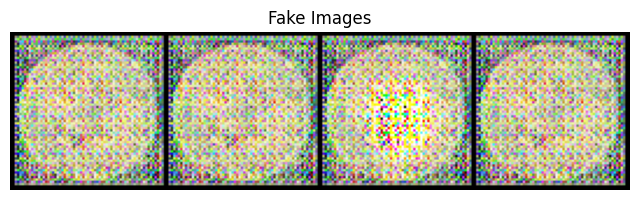

[51/2000][0/2]	Loss_D: 0.0104	Loss_G: 5.5105	D(x): 0.9969	D(G(z)): 0.0072 / 0.0044
[52/2000][0/2]	Loss_D: 0.5080	Loss_G: 0.3101	D(x): 0.6496	D(G(z)): 0.0019 / 0.7342
[53/2000][0/2]	Loss_D: 5.0235	Loss_G: 0.7997	D(x): 0.0084	D(G(z)): 0.0001 / 0.4511
[54/2000][0/2]	Loss_D: 1.6504	Loss_G: 1.0917	D(x): 0.2426	D(G(z)): 0.0412 / 0.3401
[55/2000][0/2]	Loss_D: 0.8292	Loss_G: 6.8421	D(x): 0.4442	D(G(z)): 0.0018 / 0.0012
[56/2000][0/2]	Loss_D: 1.0873	Loss_G: 11.7868	D(x): 0.9972	D(G(z)): 0.6615 / 0.0000
[57/2000][0/2]	Loss_D: 0.0151	Loss_G: 5.1233	D(x): 0.9968	D(G(z)): 0.0118 / 0.0224
[58/2000][0/2]	Loss_D: 0.2632	Loss_G: 5.7343	D(x): 0.8032	D(G(z)): 0.0269 / 0.0038
[59/2000][0/2]	Loss_D: 0.8528	Loss_G: 1.9136	D(x): 0.4693	D(G(z)): 0.0268 / 0.4838
[60/2000][0/2]	Loss_D: 1.6681	Loss_G: 10.9906	D(x): 0.4871	D(G(z)): 0.0000 / 0.0001
[61/2000][0/2]	Loss_D: 0.0464	Loss_G: 6.3392	D(x): 0.9629	D(G(z)): 0.0072 / 0.0151
[62/2000][0/2]	Loss_D: 0.2438	Loss_G: 5.0155	D(x): 0.9993	D(G(z)): 0.2077 / 0.0136
[6

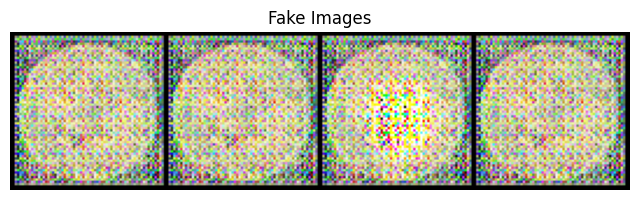

[101/2000][0/2]	Loss_D: 0.0270	Loss_G: 5.0972	D(x): 0.9979	D(G(z)): 0.0246 / 0.0216
[102/2000][0/2]	Loss_D: 1.1574	Loss_G: 12.6537	D(x): 0.9926	D(G(z)): 0.5901 / 0.0000
[103/2000][0/2]	Loss_D: 0.0083	Loss_G: 6.4558	D(x): 0.9936	D(G(z)): 0.0018 / 0.0040
[104/2000][0/2]	Loss_D: 0.0999	Loss_G: 6.3858	D(x): 0.9975	D(G(z)): 0.0913 / 0.0054
[105/2000][0/2]	Loss_D: 0.0629	Loss_G: 4.7991	D(x): 0.9666	D(G(z)): 0.0277 / 0.0235
[106/2000][0/2]	Loss_D: 0.6192	Loss_G: 4.0692	D(x): 0.6690	D(G(z)): 0.0039 / 0.0222
[107/2000][0/2]	Loss_D: 0.1035	Loss_G: 7.2188	D(x): 0.9086	D(G(z)): 0.0035 / 0.0008
[108/2000][0/2]	Loss_D: 0.0296	Loss_G: 4.6177	D(x): 0.9909	D(G(z)): 0.0201 / 0.0124
[109/2000][0/2]	Loss_D: 0.0162	Loss_G: 5.8190	D(x): 0.9922	D(G(z)): 0.0083 / 0.0051
[110/2000][0/2]	Loss_D: 0.3735	Loss_G: 6.9032	D(x): 0.7582	D(G(z)): 0.0010 / 0.0019
[111/2000][0/2]	Loss_D: 0.0265	Loss_G: 5.3608	D(x): 0.9949	D(G(z)): 0.0210 / 0.0142
[112/2000][0/2]	Loss_D: 0.1474	Loss_G: 10.1530	D(x): 0.8715	D(G(z)): 0.0002

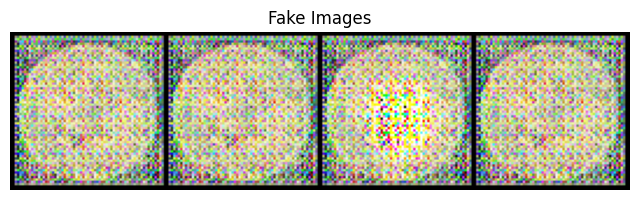

[151/2000][0/2]	Loss_D: 3.1011	Loss_G: 18.4354	D(x): 0.9981	D(G(z)): 0.9525 / 0.0000
[152/2000][0/2]	Loss_D: 3.1415	Loss_G: 0.0798	D(x): 0.0477	D(G(z)): 0.0001 / 0.9236
[153/2000][0/2]	Loss_D: 1.3579	Loss_G: 13.1735	D(x): 0.9986	D(G(z)): 0.7283 / 0.0000
[154/2000][0/2]	Loss_D: 0.0264	Loss_G: 3.8158	D(x): 0.9873	D(G(z)): 0.0136 / 0.0235
[155/2000][0/2]	Loss_D: 0.2489	Loss_G: 11.6931	D(x): 0.7919	D(G(z)): 0.0005 / 0.0000
[156/2000][0/2]	Loss_D: 0.1325	Loss_G: 4.4458	D(x): 0.9733	D(G(z)): 0.0942 / 0.0137
[157/2000][0/2]	Loss_D: 2.3337	Loss_G: 11.9509	D(x): 0.9845	D(G(z)): 0.8850 / 0.0000
[158/2000][0/2]	Loss_D: 0.2539	Loss_G: 1.2182	D(x): 0.8795	D(G(z)): 0.1064 / 0.3115
[159/2000][0/2]	Loss_D: 2.8481	Loss_G: 8.0604	D(x): 0.0897	D(G(z)): 0.0003 / 0.0033
[160/2000][0/2]	Loss_D: 0.7229	Loss_G: 7.9520	D(x): 0.9882	D(G(z)): 0.4599 / 0.0010
[161/2000][0/2]	Loss_D: 0.6022	Loss_G: 2.1426	D(x): 0.6468	D(G(z)): 0.0093 / 0.1688
[162/2000][0/2]	Loss_D: 0.0459	Loss_G: 8.9293	D(x): 0.9589	D(G(z)): 0.00

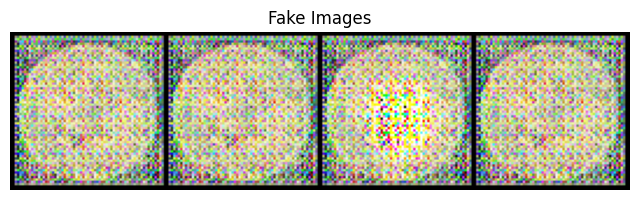

[201/2000][0/2]	Loss_D: 0.0154	Loss_G: 6.5207	D(x): 0.9927	D(G(z)): 0.0081 / 0.0016
[202/2000][0/2]	Loss_D: 0.0100	Loss_G: 6.3470	D(x): 0.9923	D(G(z)): 0.0022 / 0.0018
[203/2000][0/2]	Loss_D: 0.0495	Loss_G: 5.5684	D(x): 0.9968	D(G(z)): 0.0449 / 0.0062
[204/2000][0/2]	Loss_D: 0.0060	Loss_G: 9.0366	D(x): 0.9943	D(G(z)): 0.0002 / 0.0001
[205/2000][0/2]	Loss_D: 0.0046	Loss_G: 8.0229	D(x): 0.9959	D(G(z)): 0.0004 / 0.0004
[206/2000][0/2]	Loss_D: 0.0411	Loss_G: 5.9398	D(x): 0.9978	D(G(z)): 0.0378 / 0.0026
[207/2000][0/2]	Loss_D: 0.0258	Loss_G: 5.8887	D(x): 0.9936	D(G(z)): 0.0192 / 0.0029
[208/2000][0/2]	Loss_D: 0.0049	Loss_G: 7.6712	D(x): 0.9957	D(G(z)): 0.0006 / 0.0005
[209/2000][0/2]	Loss_D: 0.0051	Loss_G: 7.5778	D(x): 0.9970	D(G(z)): 0.0021 / 0.0018
[210/2000][0/2]	Loss_D: 0.0052	Loss_G: 8.4503	D(x): 0.9957	D(G(z)): 0.0008 / 0.0005
[211/2000][0/2]	Loss_D: 0.0067	Loss_G: 6.8156	D(x): 0.9968	D(G(z)): 0.0034 / 0.0022
[212/2000][0/2]	Loss_D: 0.0155	Loss_G: 5.1896	D(x): 0.9963	D(G(z)): 0.0117 /

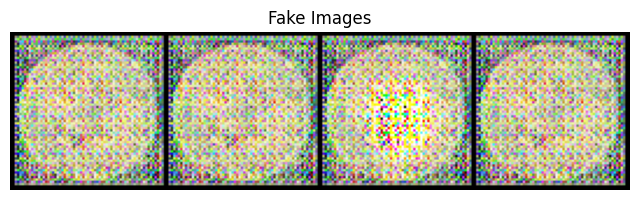

[251/2000][0/2]	Loss_D: 0.1572	Loss_G: 5.6835	D(x): 0.8560	D(G(z)): 0.0001 / 0.0034
[252/2000][0/2]	Loss_D: 1.3642	Loss_G: 27.3341	D(x): 0.9991	D(G(z)): 0.7432 / 0.0000
[253/2000][0/2]	Loss_D: 3.0543	Loss_G: 13.0896	D(x): 0.0949	D(G(z)): 0.0000 / 0.0000
[254/2000][0/2]	Loss_D: 0.0018	Loss_G: 4.5153	D(x): 1.0000	D(G(z)): 0.0018 / 0.0112
[255/2000][0/2]	Loss_D: 0.3403	Loss_G: 7.9635	D(x): 1.0000	D(G(z)): 0.2861 / 0.0004
[256/2000][0/2]	Loss_D: 0.0015	Loss_G: 8.2259	D(x): 1.0000	D(G(z)): 0.0015 / 0.0003
[257/2000][0/2]	Loss_D: 0.0392	Loss_G: 5.0075	D(x): 1.0000	D(G(z)): 0.0383 / 0.0068
[258/2000][0/2]	Loss_D: 0.0157	Loss_G: 7.1203	D(x): 0.9998	D(G(z)): 0.0154 / 0.0008
[259/2000][0/2]	Loss_D: 0.1145	Loss_G: 8.6932	D(x): 0.9987	D(G(z)): 0.1063 / 0.0002
[260/2000][0/2]	Loss_D: 0.0485	Loss_G: 7.7068	D(x): 0.9908	D(G(z)): 0.0384 / 0.0005
[261/2000][0/2]	Loss_D: 0.0430	Loss_G: 6.3861	D(x): 0.9977	D(G(z)): 0.0398 / 0.0017
[262/2000][0/2]	Loss_D: 2.0970	Loss_G: 27.6100	D(x): 0.9990	D(G(z)): 0.877

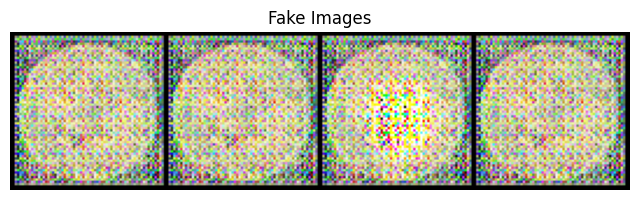

[301/2000][0/2]	Loss_D: 0.7134	Loss_G: 3.1219	D(x): 0.7654	D(G(z)): 0.2983 / 0.0466
[302/2000][0/2]	Loss_D: 3.1560	Loss_G: 4.0616	D(x): 0.1060	D(G(z)): 0.0011 / 0.0175
[303/2000][0/2]	Loss_D: 0.2945	Loss_G: 8.3374	D(x): 0.9982	D(G(z)): 0.2532 / 0.0003
[304/2000][0/2]	Loss_D: 0.7571	Loss_G: 11.1580	D(x): 0.9966	D(G(z)): 0.5289 / 0.0000
[305/2000][0/2]	Loss_D: 0.0406	Loss_G: 4.4798	D(x): 0.9716	D(G(z)): 0.0116 / 0.0118
[306/2000][0/2]	Loss_D: 0.3251	Loss_G: 4.4983	D(x): 0.8062	D(G(z)): 0.0737 / 0.0121
[307/2000][0/2]	Loss_D: 0.0036	Loss_G: 6.0708	D(x): 0.9980	D(G(z)): 0.0016 / 0.0023
[308/2000][0/2]	Loss_D: 3.5547	Loss_G: 1.2972	D(x): 0.1111	D(G(z)): 0.0001 / 0.2757
[309/2000][0/2]	Loss_D: 2.8297	Loss_G: 16.7745	D(x): 0.9994	D(G(z)): 0.9334 / 0.0000
[310/2000][0/2]	Loss_D: 0.5653	Loss_G: 1.2660	D(x): 0.5920	D(G(z)): 0.0010 / 0.3241
[311/2000][0/2]	Loss_D: 0.5182	Loss_G: 6.9191	D(x): 0.7492	D(G(z)): 0.0086 / 0.0011
[312/2000][0/2]	Loss_D: 2.5182	Loss_G: 10.4612	D(x): 0.9740	D(G(z)): 0.906

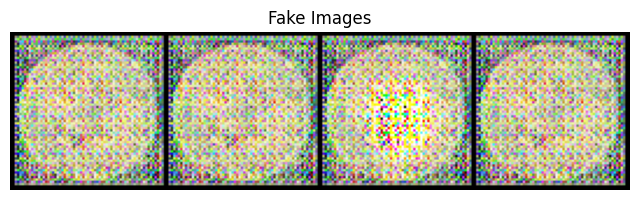

[351/2000][0/2]	Loss_D: 0.0405	Loss_G: 3.9233	D(x): 0.9998	D(G(z)): 0.0393 / 0.0227
[352/2000][0/2]	Loss_D: 0.0426	Loss_G: 4.0421	D(x): 0.9998	D(G(z)): 0.0414 / 0.0190
[353/2000][0/2]	Loss_D: 0.0988	Loss_G: 4.1784	D(x): 0.9995	D(G(z)): 0.0932 / 0.0166
[354/2000][0/2]	Loss_D: 1.9172	Loss_G: 1.2992	D(x): 0.1635	D(G(z)): 0.0021 / 0.2842
[355/2000][0/2]	Loss_D: 1.4181	Loss_G: 2.8556	D(x): 0.3667	D(G(z)): 0.0564 / 0.0576
[356/2000][0/2]	Loss_D: 0.3713	Loss_G: 2.9544	D(x): 0.7263	D(G(z)): 0.0389 / 0.0571
[357/2000][0/2]	Loss_D: 2.2287	Loss_G: 1.6463	D(x): 0.1539	D(G(z)): 0.0032 / 0.1962
[358/2000][0/2]	Loss_D: 0.1580	Loss_G: 5.5766	D(x): 0.8624	D(G(z)): 0.0076 / 0.0048
[359/2000][0/2]	Loss_D: 0.0219	Loss_G: 4.0299	D(x): 0.9907	D(G(z)): 0.0125 / 0.0185
[360/2000][0/2]	Loss_D: 0.0060	Loss_G: 9.5930	D(x): 0.9941	D(G(z)): 0.0001 / 0.0001
[361/2000][0/2]	Loss_D: 0.0245	Loss_G: 4.1601	D(x): 0.9953	D(G(z)): 0.0196 / 0.0159
[362/2000][0/2]	Loss_D: 3.4338	Loss_G: 5.3054	D(x): 0.0384	D(G(z)): 0.0002 /

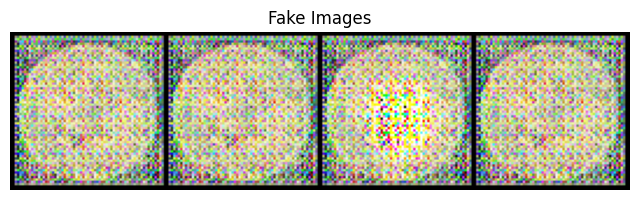

[401/2000][0/2]	Loss_D: 1.7076	Loss_G: 7.2970	D(x): 0.9795	D(G(z)): 0.8088 / 0.0008
[402/2000][0/2]	Loss_D: 0.7564	Loss_G: 2.9078	D(x): 0.9264	D(G(z)): 0.4797 / 0.0610
[403/2000][0/2]	Loss_D: 0.5421	Loss_G: 1.8351	D(x): 0.6889	D(G(z)): 0.1400 / 0.1678
[404/2000][0/2]	Loss_D: 0.1246	Loss_G: 4.2284	D(x): 0.9158	D(G(z)): 0.0352 / 0.0153
[405/2000][0/2]	Loss_D: 0.2805	Loss_G: 2.9641	D(x): 0.8414	D(G(z)): 0.0978 / 0.0555
[406/2000][0/2]	Loss_D: 0.0860	Loss_G: 5.2186	D(x): 0.9251	D(G(z)): 0.0079 / 0.0068
[407/2000][0/2]	Loss_D: 3.0967	Loss_G: 2.0226	D(x): 0.0476	D(G(z)): 0.0002 / 0.1366
[408/2000][0/2]	Loss_D: 0.8806	Loss_G: 4.6017	D(x): 0.4703	D(G(z)): 0.0037 / 0.0102
[409/2000][0/2]	Loss_D: 0.2432	Loss_G: 3.7559	D(x): 0.9814	D(G(z)): 0.1961 / 0.0238
[410/2000][0/2]	Loss_D: 0.7642	Loss_G: 7.4920	D(x): 0.9767	D(G(z)): 0.5050 / 0.0006
[411/2000][0/2]	Loss_D: 0.2427	Loss_G: 3.6520	D(x): 0.9862	D(G(z)): 0.1994 / 0.0278
[412/2000][0/2]	Loss_D: 1.1762	Loss_G: 2.0264	D(x): 0.3660	D(G(z)): 0.0493 /

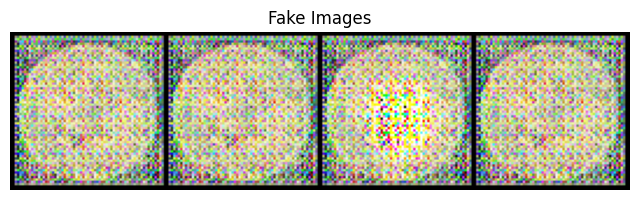

[451/2000][0/2]	Loss_D: 0.1046	Loss_G: 4.7457	D(x): 0.9148	D(G(z)): 0.0138 / 0.0092
[452/2000][0/2]	Loss_D: 0.0020	Loss_G: 10.2326	D(x): 0.9981	D(G(z)): 0.0000 / 0.0000
[453/2000][0/2]	Loss_D: 0.6551	Loss_G: 10.7248	D(x): 0.9987	D(G(z)): 0.4509 / 0.0000
[454/2000][0/2]	Loss_D: 0.1156	Loss_G: 4.1588	D(x): 0.9218	D(G(z)): 0.0251 / 0.0208
[455/2000][0/2]	Loss_D: 0.0484	Loss_G: 11.2162	D(x): 0.9534	D(G(z)): 0.0000 / 0.0000
[456/2000][0/2]	Loss_D: 0.0292	Loss_G: 5.2468	D(x): 0.9771	D(G(z)): 0.0059 / 0.0058
[457/2000][0/2]	Loss_D: 0.1273	Loss_G: 6.3782	D(x): 0.9971	D(G(z)): 0.1166 / 0.0017
[458/2000][0/2]	Loss_D: 0.0123	Loss_G: 7.1682	D(x): 0.9897	D(G(z)): 0.0020 / 0.0010
[459/2000][0/2]	Loss_D: 0.0181	Loss_G: 5.2051	D(x): 0.9889	D(G(z)): 0.0068 / 0.0055
[460/2000][0/2]	Loss_D: 0.0351	Loss_G: 4.4306	D(x): 0.9964	D(G(z)): 0.0308 / 0.0129
[461/2000][0/2]	Loss_D: 0.0108	Loss_G: 6.3293	D(x): 0.9911	D(G(z)): 0.0018 / 0.0019
[462/2000][0/2]	Loss_D: 7.8944	Loss_G: 4.1012	D(x): 0.0004	D(G(z)): 0.000

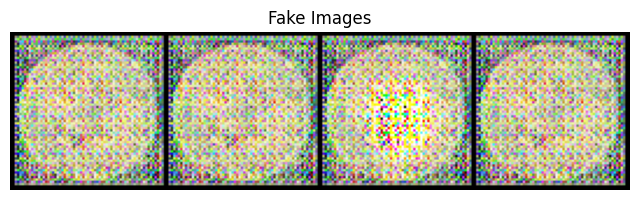

[501/2000][0/2]	Loss_D: 0.0172	Loss_G: 5.3350	D(x): 0.9900	D(G(z)): 0.0071 / 0.0053
[502/2000][0/2]	Loss_D: 10.4552	Loss_G: 6.1316	D(x): 0.0001	D(G(z)): 0.0000 / 0.0024
[503/2000][0/2]	Loss_D: 4.8251	Loss_G: 2.4239	D(x): 0.9465	D(G(z)): 0.9827 / 0.3024
[504/2000][0/2]	Loss_D: 0.5861	Loss_G: 2.7382	D(x): 0.7319	D(G(z)): 0.1789 / 0.0712
[505/2000][0/2]	Loss_D: 0.8941	Loss_G: 5.5716	D(x): 0.8989	D(G(z)): 0.5138 / 0.0069
[506/2000][0/2]	Loss_D: 0.8627	Loss_G: 5.0358	D(x): 0.8759	D(G(z)): 0.5105 / 0.0091
[507/2000][0/2]	Loss_D: 1.1611	Loss_G: 6.4108	D(x): 0.9799	D(G(z)): 0.6775 / 0.0026
[508/2000][0/2]	Loss_D: 0.9278	Loss_G: 2.3713	D(x): 0.7375	D(G(z)): 0.3231 / 0.2837
[509/2000][0/2]	Loss_D: 1.8373	Loss_G: 3.4049	D(x): 0.1815	D(G(z)): 0.0190 / 0.1210
[510/2000][0/2]	Loss_D: 0.5272	Loss_G: 6.2855	D(x): 0.9935	D(G(z)): 0.3757 / 0.0044
[511/2000][0/2]	Loss_D: 2.2586	Loss_G: 8.7421	D(x): 0.9997	D(G(z)): 0.8881 / 0.0003
[512/2000][0/2]	Loss_D: 0.0095	Loss_G: 5.0781	D(x): 0.9991	D(G(z)): 0.0086 

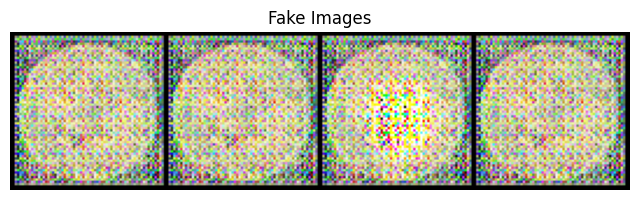

[551/2000][0/2]	Loss_D: 0.0572	Loss_G: 3.6855	D(x): 0.9920	D(G(z)): 0.0476 / 0.0291
[552/2000][0/2]	Loss_D: 0.0169	Loss_G: 5.8516	D(x): 0.9868	D(G(z)): 0.0036 / 0.0033
[553/2000][0/2]	Loss_D: 0.0970	Loss_G: 3.9518	D(x): 0.9904	D(G(z)): 0.0832 / 0.0211
[554/2000][0/2]	Loss_D: 0.0580	Loss_G: 4.3036	D(x): 0.9888	D(G(z)): 0.0453 / 0.0303
[555/2000][0/2]	Loss_D: 0.0632	Loss_G: 8.0324	D(x): 0.9399	D(G(z)): 0.0011 / 0.0012
[556/2000][0/2]	Loss_D: 0.0301	Loss_G: 5.0938	D(x): 0.9924	D(G(z)): 0.0222 / 0.0227
[557/2000][0/2]	Loss_D: 0.0066	Loss_G: 6.1060	D(x): 0.9958	D(G(z)): 0.0023 / 0.0024
[558/2000][0/2]	Loss_D: 0.0054	Loss_G: 6.6872	D(x): 0.9962	D(G(z)): 0.0015 / 0.0014
[559/2000][0/2]	Loss_D: 0.0769	Loss_G: 4.0240	D(x): 0.9902	D(G(z)): 0.0642 / 0.0243
[560/2000][0/2]	Loss_D: 0.0220	Loss_G: 7.9017	D(x): 0.9799	D(G(z)): 0.0016 / 0.0014
[561/2000][0/2]	Loss_D: 0.0158	Loss_G: 6.3659	D(x): 0.9901	D(G(z)): 0.0059 / 0.0060
[562/2000][0/2]	Loss_D: 0.0445	Loss_G: 4.0844	D(x): 0.9923	D(G(z)): 0.0359 /

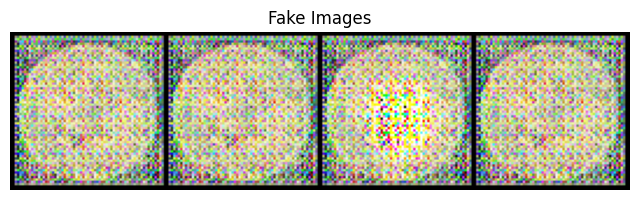

[601/2000][0/2]	Loss_D: 0.0116	Loss_G: 4.8900	D(x): 0.9972	D(G(z)): 0.0087 / 0.0084
[602/2000][0/2]	Loss_D: 0.0213	Loss_G: 4.4610	D(x): 0.9948	D(G(z)): 0.0159 / 0.0118
[603/2000][0/2]	Loss_D: 0.0264	Loss_G: 4.1992	D(x): 0.9972	D(G(z)): 0.0233 / 0.0162
[604/2000][0/2]	Loss_D: 0.0077	Loss_G: 5.8728	D(x): 0.9955	D(G(z)): 0.0031 / 0.0031
[605/2000][0/2]	Loss_D: 0.0146	Loss_G: 5.9621	D(x): 0.9912	D(G(z)): 0.0057 / 0.0056
[606/2000][0/2]	Loss_D: 0.0089	Loss_G: 6.9314	D(x): 0.9925	D(G(z)): 0.0013 / 0.0012
[607/2000][0/2]	Loss_D: 0.0120	Loss_G: 4.7385	D(x): 0.9982	D(G(z)): 0.0101 / 0.0092
[608/2000][0/2]	Loss_D: 0.0185	Loss_G: 8.1960	D(x): 0.9822	D(G(z)): 0.0004 / 0.0003
[609/2000][0/2]	Loss_D: 0.0131	Loss_G: 6.4213	D(x): 0.9893	D(G(z)): 0.0023 / 0.0024
[610/2000][0/2]	Loss_D: 0.0367	Loss_G: 4.3261	D(x): 0.9944	D(G(z)): 0.0305 / 0.0197
[611/2000][0/2]	Loss_D: 0.0062	Loss_G: 5.8804	D(x): 0.9975	D(G(z)): 0.0037 / 0.0036
[612/2000][0/2]	Loss_D: 0.0065	Loss_G: 6.6982	D(x): 0.9951	D(G(z)): 0.0016 /

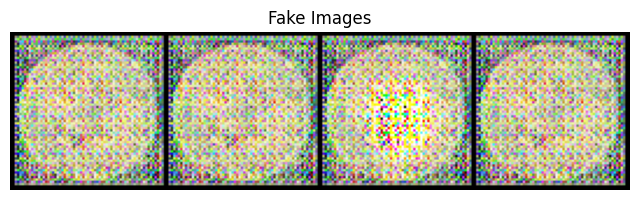

[651/2000][0/2]	Loss_D: 0.1714	Loss_G: 3.5968	D(x): 0.8954	D(G(z)): 0.0424 / 0.0357
[652/2000][0/2]	Loss_D: 11.1260	Loss_G: 14.1762	D(x): 0.0000	D(G(z)): 0.0000 / 0.0000
[653/2000][0/2]	Loss_D: 0.1408	Loss_G: 2.0361	D(x): 0.9997	D(G(z)): 0.1168 / 0.1328
[654/2000][0/2]	Loss_D: 0.3808	Loss_G: 9.2259	D(x): 0.7059	D(G(z)): 0.0013 / 0.0002
[655/2000][0/2]	Loss_D: 0.1027	Loss_G: 4.7065	D(x): 0.9278	D(G(z)): 0.0192 / 0.0169
[656/2000][0/2]	Loss_D: 0.1113	Loss_G: 3.8616	D(x): 0.9958	D(G(z)): 0.0995 / 0.0228
[657/2000][0/2]	Loss_D: 0.1972	Loss_G: 3.2347	D(x): 0.9104	D(G(z)): 0.0928 / 0.0504
[658/2000][0/2]	Loss_D: 0.0772	Loss_G: 4.7565	D(x): 0.9454	D(G(z)): 0.0196 / 0.0107
[659/2000][0/2]	Loss_D: 0.2916	Loss_G: 3.7399	D(x): 0.8035	D(G(z)): 0.0205 / 0.0365
[660/2000][0/2]	Loss_D: 0.2723	Loss_G: 6.1498	D(x): 0.7929	D(G(z)): 0.0027 / 0.0035
[661/2000][0/2]	Loss_D: 3.6726	Loss_G: 8.6330	D(x): 0.1220	D(G(z)): 0.0000 / 0.0003
[662/2000][0/2]	Loss_D: 0.0636	Loss_G: 1.3235	D(x): 0.9998	D(G(z)): 0.0609

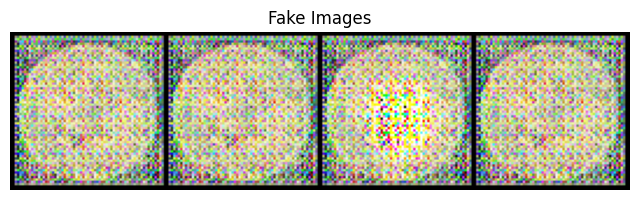

[701/2000][0/2]	Loss_D: 0.3404	Loss_G: 3.4914	D(x): 0.8257	D(G(z)): 0.1119 / 0.0368
[702/2000][0/2]	Loss_D: 0.2193	Loss_G: 3.0200	D(x): 0.9289	D(G(z)): 0.1303 / 0.0509
[703/2000][0/2]	Loss_D: 0.0868	Loss_G: 4.4112	D(x): 0.9722	D(G(z)): 0.0564 / 0.0174
[704/2000][0/2]	Loss_D: 0.3385	Loss_G: 4.2136	D(x): 0.7295	D(G(z)): 0.0088 / 0.0149
[705/2000][0/2]	Loss_D: 1.2258	Loss_G: 6.4665	D(x): 0.9926	D(G(z)): 0.6696 / 0.0023
[706/2000][0/2]	Loss_D: 0.2370	Loss_G: 3.9560	D(x): 0.8514	D(G(z)): 0.0246 / 0.0218
[707/2000][0/2]	Loss_D: 0.0948	Loss_G: 5.4290	D(x): 0.9375	D(G(z)): 0.0256 / 0.0189
[708/2000][0/2]	Loss_D: 0.0463	Loss_G: 5.6798	D(x): 0.9692	D(G(z)): 0.0146 / 0.0086
[709/2000][0/2]	Loss_D: 0.4071	Loss_G: 5.9073	D(x): 0.9959	D(G(z)): 0.2902 / 0.0028
[710/2000][0/2]	Loss_D: 0.1607	Loss_G: 3.6940	D(x): 0.9078	D(G(z)): 0.0594 / 0.0295
[711/2000][0/2]	Loss_D: 0.0853	Loss_G: 4.1711	D(x): 0.9941	D(G(z)): 0.0753 / 0.0161
[712/2000][0/2]	Loss_D: 0.0476	Loss_G: 4.8710	D(x): 0.9744	D(G(z)): 0.0214 /

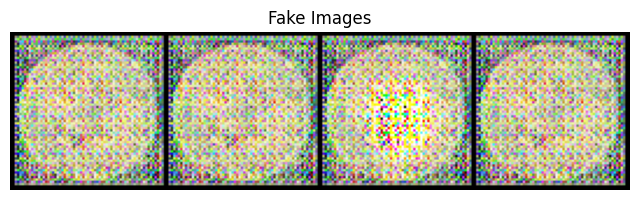

[751/2000][0/2]	Loss_D: 1.8024	Loss_G: 4.7574	D(x): 0.2304	D(G(z)): 0.0006 / 0.0117
[752/2000][0/2]	Loss_D: 0.3593	Loss_G: 5.8481	D(x): 0.9524	D(G(z)): 0.2479 / 0.0093
[753/2000][0/2]	Loss_D: 0.9959	Loss_G: 6.8909	D(x): 0.9996	D(G(z)): 0.5560 / 0.0012
[754/2000][0/2]	Loss_D: 0.0739	Loss_G: 3.4984	D(x): 0.9905	D(G(z)): 0.0619 / 0.0335
[755/2000][0/2]	Loss_D: 1.2734	Loss_G: 7.3196	D(x): 0.4032	D(G(z)): 0.0018 / 0.0020
[756/2000][0/2]	Loss_D: 1.7790	Loss_G: 6.4183	D(x): 0.9995	D(G(z)): 0.8153 / 0.0023
[757/2000][0/2]	Loss_D: 0.8721	Loss_G: 2.6671	D(x): 0.6579	D(G(z)): 0.2608 / 0.0726
[758/2000][0/2]	Loss_D: 0.0696	Loss_G: 5.0238	D(x): 0.9838	D(G(z)): 0.0504 / 0.0138
[759/2000][0/2]	Loss_D: 1.0397	Loss_G: 2.8618	D(x): 0.4706	D(G(z)): 0.0100 / 0.0706
[760/2000][0/2]	Loss_D: 0.1489	Loss_G: 3.9042	D(x): 0.9918	D(G(z)): 0.1296 / 0.0237
[761/2000][0/2]	Loss_D: 1.2683	Loss_G: 11.1912	D(x): 0.9974	D(G(z)): 0.6838 / 0.0000
[762/2000][0/2]	Loss_D: 0.1763	Loss_G: 2.8311	D(x): 0.9402	D(G(z)): 0.1035 

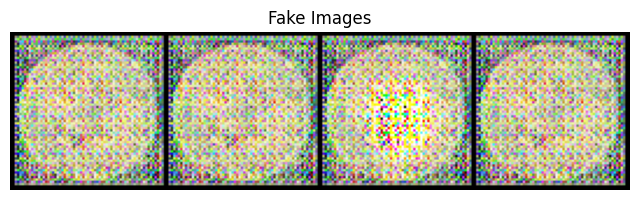

[801/2000][0/2]	Loss_D: 0.0682	Loss_G: 4.8421	D(x): 0.9458	D(G(z)): 0.0118 / 0.0124
[802/2000][0/2]	Loss_D: 0.2879	Loss_G: 6.5474	D(x): 0.7723	D(G(z)): 0.0017 / 0.0017
[803/2000][0/2]	Loss_D: 0.0887	Loss_G: 2.6723	D(x): 0.9832	D(G(z)): 0.0673 / 0.0884
[804/2000][0/2]	Loss_D: 2.7149	Loss_G: 2.6208	D(x): 0.1009	D(G(z)): 0.0060 / 0.0975
[805/2000][0/2]	Loss_D: 0.5969	Loss_G: 5.9130	D(x): 0.9503	D(G(z)): 0.3849 / 0.0042
[806/2000][0/2]	Loss_D: 2.2249	Loss_G: 6.7114	D(x): 0.9996	D(G(z)): 0.8586 / 0.0014
[807/2000][0/2]	Loss_D: 0.1391	Loss_G: 3.6910	D(x): 0.8908	D(G(z)): 0.0092 / 0.0273
[808/2000][0/2]	Loss_D: 1.0555	Loss_G: 3.2874	D(x): 0.3774	D(G(z)): 0.0120 / 0.0431
[809/2000][0/2]	Loss_D: 0.3844	Loss_G: 4.8133	D(x): 0.9214	D(G(z)): 0.2444 / 0.0278
[810/2000][0/2]	Loss_D: 0.3335	Loss_G: 3.7252	D(x): 0.9202	D(G(z)): 0.1821 / 0.0279
[811/2000][0/2]	Loss_D: 0.0522	Loss_G: 3.8837	D(x): 0.9769	D(G(z)): 0.0276 / 0.0240
[812/2000][0/2]	Loss_D: 0.0142	Loss_G: 8.8136	D(x): 0.9861	D(G(z)): 0.0002 /

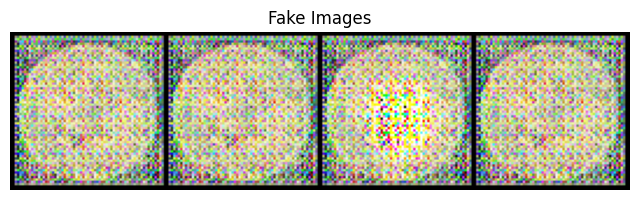

[851/2000][0/2]	Loss_D: 0.0035	Loss_G: 4.9369	D(x): 0.9997	D(G(z)): 0.0032 / 0.0079
[852/2000][0/2]	Loss_D: 0.3245	Loss_G: 9.2396	D(x): 0.9995	D(G(z)): 0.2661 / 0.0001
[853/2000][0/2]	Loss_D: 0.4599	Loss_G: 6.1216	D(x): 0.6672	D(G(z)): 0.0009 / 0.0045
[854/2000][0/2]	Loss_D: 0.2597	Loss_G: 5.8083	D(x): 0.9902	D(G(z)): 0.2032 / 0.0060
[855/2000][0/2]	Loss_D: 0.0177	Loss_G: 8.5316	D(x): 0.9831	D(G(z)): 0.0006 / 0.0003
[856/2000][0/2]	Loss_D: 0.0129	Loss_G: 8.6752	D(x): 0.9875	D(G(z)): 0.0002 / 0.0002
[857/2000][0/2]	Loss_D: 0.0517	Loss_G: 4.6662	D(x): 0.9982	D(G(z)): 0.0485 / 0.0098
[858/2000][0/2]	Loss_D: 0.0243	Loss_G: 5.3356	D(x): 0.9908	D(G(z)): 0.0147 / 0.0093
[859/2000][0/2]	Loss_D: 0.0229	Loss_G: 8.6718	D(x): 0.9777	D(G(z)): 0.0002 / 0.0002
[860/2000][0/2]	Loss_D: 0.0090	Loss_G: 5.4277	D(x): 0.9977	D(G(z)): 0.0067 / 0.0051
[861/2000][0/2]	Loss_D: 0.0253	Loss_G: 4.5295	D(x): 0.9906	D(G(z)): 0.0157 / 0.0118
[862/2000][0/2]	Loss_D: 0.1223	Loss_G: 10.0119	D(x): 0.8895	D(G(z)): 0.0001 

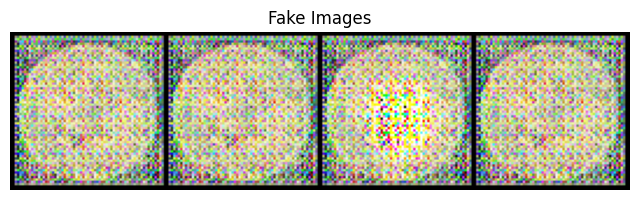

[901/2000][0/2]	Loss_D: 1.8187	Loss_G: 5.6576	D(x): 0.9971	D(G(z)): 0.8028 / 0.0169
[902/2000][0/2]	Loss_D: 1.5292	Loss_G: 1.7068	D(x): 0.4234	D(G(z)): 0.0883 / 0.4126
[903/2000][0/2]	Loss_D: 0.0531	Loss_G: 6.7154	D(x): 0.9991	D(G(z)): 0.0500 / 0.0025
[904/2000][0/2]	Loss_D: 0.5565	Loss_G: 4.0085	D(x): 0.9232	D(G(z)): 0.2956 / 0.0391
[905/2000][0/2]	Loss_D: 0.1554	Loss_G: 4.4899	D(x): 0.9399	D(G(z)): 0.0872 / 0.0119
[906/2000][0/2]	Loss_D: 2.2314	Loss_G: 8.5986	D(x): 0.9991	D(G(z)): 0.8712 / 0.0026
[907/2000][0/2]	Loss_D: 0.9454	Loss_G: 3.9014	D(x): 0.4307	D(G(z)): 0.0093 / 0.0434
[908/2000][0/2]	Loss_D: 0.6042	Loss_G: 5.9732	D(x): 0.9677	D(G(z)): 0.4036 / 0.0070
[909/2000][0/2]	Loss_D: 0.1733	Loss_G: 3.1029	D(x): 0.9734	D(G(z)): 0.1349 / 0.0558
[910/2000][0/2]	Loss_D: 0.0999	Loss_G: 6.3444	D(x): 0.9598	D(G(z)): 0.0541 / 0.0056
[911/2000][0/2]	Loss_D: 2.5093	Loss_G: 9.0593	D(x): 0.9988	D(G(z)): 0.9130 / 0.0009
[912/2000][0/2]	Loss_D: 0.1199	Loss_G: 3.0313	D(x): 0.9733	D(G(z)): 0.0871 /

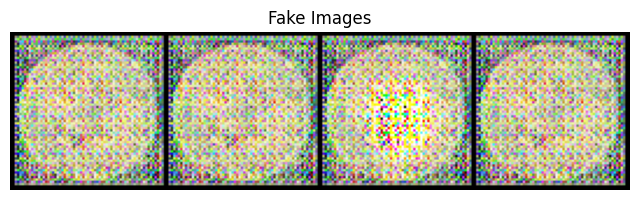

[951/2000][0/2]	Loss_D: 1.0894	Loss_G: 11.7940	D(x): 0.9894	D(G(z)): 0.5615 / 0.0000
[952/2000][0/2]	Loss_D: 0.3090	Loss_G: 4.6260	D(x): 0.7535	D(G(z)): 0.0004 / 0.0125
[953/2000][0/2]	Loss_D: 0.3317	Loss_G: 5.0018	D(x): 0.7651	D(G(z)): 0.0139 / 0.0160
[954/2000][0/2]	Loss_D: 0.0076	Loss_G: 7.4637	D(x): 0.9962	D(G(z)): 0.0038 / 0.0012
[955/2000][0/2]	Loss_D: 0.0262	Loss_G: 5.3204	D(x): 0.9896	D(G(z)): 0.0153 / 0.0264
[956/2000][0/2]	Loss_D: 2.7583	Loss_G: 4.3073	D(x): 0.1133	D(G(z)): 0.0001 / 0.0397
[957/2000][0/2]	Loss_D: 0.2087	Loss_G: 3.7143	D(x): 0.9208	D(G(z)): 0.1105 / 0.0246
[958/2000][0/2]	Loss_D: 3.1313	Loss_G: 6.9706	D(x): 0.0932	D(G(z)): 0.0001 / 0.0010
[959/2000][0/2]	Loss_D: 0.1083	Loss_G: 3.5081	D(x): 0.9931	D(G(z)): 0.0962 / 0.0344
[960/2000][0/2]	Loss_D: 0.1001	Loss_G: 5.6254	D(x): 0.9376	D(G(z)): 0.0329 / 0.0047
[961/2000][0/2]	Loss_D: 0.3835	Loss_G: 6.3431	D(x): 0.7546	D(G(z)): 0.0013 / 0.0020
[962/2000][0/2]	Loss_D: 0.0203	Loss_G: 4.7099	D(x): 0.9928	D(G(z)): 0.0129 

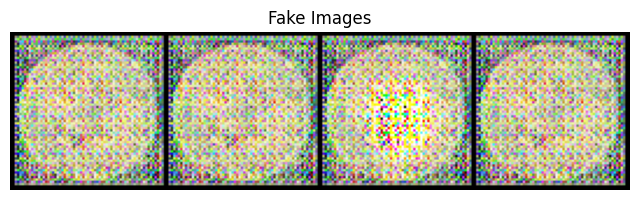

[1001/2000][0/2]	Loss_D: 0.1485	Loss_G: 1.1529	D(x): 0.9818	D(G(z)): 0.1188 / 0.3479
[1002/2000][0/2]	Loss_D: 0.0798	Loss_G: 6.6189	D(x): 0.9778	D(G(z)): 0.0537 / 0.0017
[1003/2000][0/2]	Loss_D: 0.7947	Loss_G: 3.8037	D(x): 0.9952	D(G(z)): 0.3950 / 0.0229
[1004/2000][0/2]	Loss_D: 0.9657	Loss_G: 2.7898	D(x): 0.5542	D(G(z)): 0.1136 / 0.1051
[1005/2000][0/2]	Loss_D: 0.5625	Loss_G: 7.0279	D(x): 0.9995	D(G(z)): 0.3626 / 0.0011
[1006/2000][0/2]	Loss_D: 0.1323	Loss_G: 3.8136	D(x): 0.9902	D(G(z)): 0.1134 / 0.0242
[1007/2000][0/2]	Loss_D: 0.5942	Loss_G: 6.6030	D(x): 0.9485	D(G(z)): 0.3749 / 0.0023
[1008/2000][0/2]	Loss_D: 0.1972	Loss_G: 5.6920	D(x): 0.8390	D(G(z)): 0.0057 / 0.0122
[1009/2000][0/2]	Loss_D: 0.1176	Loss_G: 3.7413	D(x): 0.9962	D(G(z)): 0.1019 / 0.0267
[1010/2000][0/2]	Loss_D: 0.0298	Loss_G: 4.6393	D(x): 0.9986	D(G(z)): 0.0277 / 0.0152
[1011/2000][0/2]	Loss_D: 1.1477	Loss_G: 9.3710	D(x): 0.9589	D(G(z)): 0.6454 / 0.0002
[1012/2000][0/2]	Loss_D: 0.0400	Loss_G: 5.1764	D(x): 0.9685	D(G(z

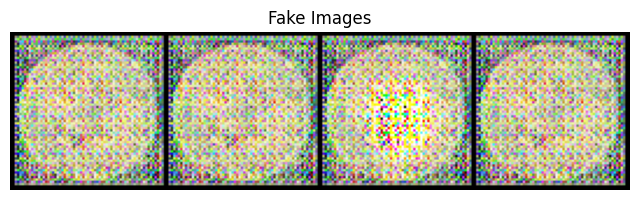

[1051/2000][0/2]	Loss_D: 0.0039	Loss_G: 6.3273	D(x): 0.9983	D(G(z)): 0.0022 / 0.0022
[1052/2000][0/2]	Loss_D: 0.0187	Loss_G: 5.4845	D(x): 0.9919	D(G(z)): 0.0104 / 0.0089
[1053/2000][0/2]	Loss_D: 0.2072	Loss_G: 9.9109	D(x): 0.8191	D(G(z)): 0.0001 / 0.0001
[1054/2000][0/2]	Loss_D: 0.0134	Loss_G: 3.5839	D(x): 0.9986	D(G(z)): 0.0119 / 0.0309
[1055/2000][0/2]	Loss_D: 0.4956	Loss_G: 6.5951	D(x): 0.9999	D(G(z)): 0.3878 / 0.0016
[1056/2000][0/2]	Loss_D: 0.1229	Loss_G: 5.1103	D(x): 0.9033	D(G(z)): 0.0093 / 0.0062
[1057/2000][0/2]	Loss_D: 0.0059	Loss_G: 9.1659	D(x): 0.9943	D(G(z)): 0.0002 / 0.0003
[1058/2000][0/2]	Loss_D: 0.8000	Loss_G: 6.7117	D(x): 0.9995	D(G(z)): 0.4307 / 0.0013
[1059/2000][0/2]	Loss_D: 0.1098	Loss_G: 6.0095	D(x): 0.8997	D(G(z)): 0.0007 / 0.0040
[1060/2000][0/2]	Loss_D: 0.6201	Loss_G: 7.6617	D(x): 0.9955	D(G(z)): 0.3524 / 0.0005
[1061/2000][0/2]	Loss_D: 1.7135	Loss_G: 5.2679	D(x): 0.2757	D(G(z)): 0.0213 / 0.0060
[1062/2000][0/2]	Loss_D: 0.9032	Loss_G: 2.4052	D(x): 0.5765	D(G(z

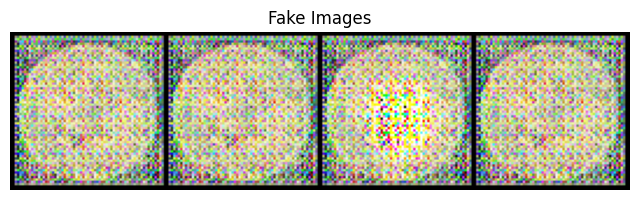

[1101/2000][0/2]	Loss_D: 0.3763	Loss_G: 6.9514	D(x): 0.7971	D(G(z)): 0.0012 / 0.0019
[1102/2000][0/2]	Loss_D: 0.1159	Loss_G: 2.8199	D(x): 0.9889	D(G(z)): 0.0934 / 0.1394
[1103/2000][0/2]	Loss_D: 0.4479	Loss_G: 5.1395	D(x): 0.9955	D(G(z)): 0.3309 / 0.0083
[1104/2000][0/2]	Loss_D: 0.3766	Loss_G: 9.9485	D(x): 0.7450	D(G(z)): 0.0000 / 0.0001
[1105/2000][0/2]	Loss_D: 0.0192	Loss_G: 7.5810	D(x): 0.9816	D(G(z)): 0.0006 / 0.0007
[1106/2000][0/2]	Loss_D: 0.0060	Loss_G: 5.4588	D(x): 0.9997	D(G(z)): 0.0058 / 0.0057
[1107/2000][0/2]	Loss_D: 0.1500	Loss_G: 3.6471	D(x): 0.9987	D(G(z)): 0.1297 / 0.0262
[1108/2000][0/2]	Loss_D: 0.0121	Loss_G: 5.6158	D(x): 0.9957	D(G(z)): 0.0078 / 0.0047
[1109/2000][0/2]	Loss_D: 0.0324	Loss_G: 2.9839	D(x): 0.9996	D(G(z)): 0.0312 / 0.1385
[1110/2000][0/2]	Loss_D: 0.0592	Loss_G: 3.4579	D(x): 0.9996	D(G(z)): 0.0567 / 0.0327
[1111/2000][0/2]	Loss_D: 1.5237	Loss_G: 8.6852	D(x): 0.2361	D(G(z)): 0.0002 / 0.0005
[1112/2000][0/2]	Loss_D: 0.0416	Loss_G: 3.7817	D(x): 0.9973	D(G(z

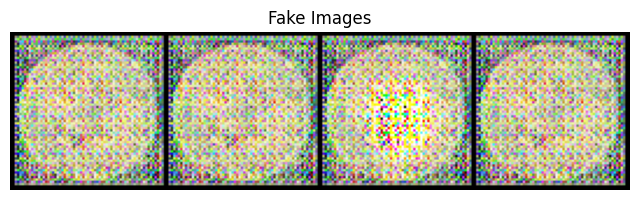

[1151/2000][0/2]	Loss_D: 0.0165	Loss_G: 4.6315	D(x): 0.9980	D(G(z)): 0.0142 / 0.0179
[1152/2000][0/2]	Loss_D: 0.0288	Loss_G: 8.7753	D(x): 0.9721	D(G(z)): 0.0004 / 0.0002
[1153/2000][0/2]	Loss_D: 0.0267	Loss_G: 4.2854	D(x): 0.9955	D(G(z)): 0.0215 / 0.0627
[1154/2000][0/2]	Loss_D: 0.0259	Loss_G: 5.0189	D(x): 0.9852	D(G(z)): 0.0109 / 0.0085
[1155/2000][0/2]	Loss_D: 0.1135	Loss_G: 3.9324	D(x): 0.9839	D(G(z)): 0.0916 / 0.0224
[1156/2000][0/2]	Loss_D: 0.0269	Loss_G: 4.8109	D(x): 0.9867	D(G(z)): 0.0133 / 0.0140
[1157/2000][0/2]	Loss_D: 0.0101	Loss_G: 5.4639	D(x): 0.9977	D(G(z)): 0.0077 / 0.0063
[1158/2000][0/2]	Loss_D: 1.8364	Loss_G: 8.1272	D(x): 0.2160	D(G(z)): 0.0003 / 0.0005
[1159/2000][0/2]	Loss_D: 0.3479	Loss_G: 4.5973	D(x): 0.9995	D(G(z)): 0.2747 / 0.0124
[1160/2000][0/2]	Loss_D: 0.0632	Loss_G: 5.6179	D(x): 0.9652	D(G(z)): 0.0265 / 0.0111
[1161/2000][0/2]	Loss_D: 4.3156	Loss_G: 6.7666	D(x): 0.9998	D(G(z)): 0.9462 / 0.0861
[1162/2000][0/2]	Loss_D: 0.0744	Loss_G: 4.5129	D(x): 0.9584	D(G(z

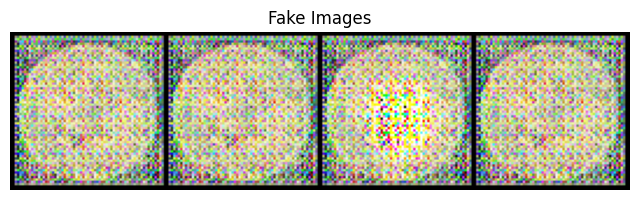

[1201/2000][0/2]	Loss_D: 0.3739	Loss_G: 4.3949	D(x): 0.9847	D(G(z)): 0.2935 / 0.0128
[1202/2000][0/2]	Loss_D: 0.1094	Loss_G: 3.4636	D(x): 0.9493	D(G(z)): 0.0549 / 0.0351
[1203/2000][0/2]	Loss_D: 0.1420	Loss_G: 4.1560	D(x): 0.9972	D(G(z)): 0.1272 / 0.0167
[1204/2000][0/2]	Loss_D: 0.0087	Loss_G: 6.9973	D(x): 0.9925	D(G(z)): 0.0012 / 0.0019
[1205/2000][0/2]	Loss_D: 0.0313	Loss_G: 4.1340	D(x): 0.9945	D(G(z)): 0.0254 / 0.0165
[1206/2000][0/2]	Loss_D: 0.1174	Loss_G: 3.7413	D(x): 0.9555	D(G(z)): 0.0687 / 0.0248
[1207/2000][0/2]	Loss_D: 0.1444	Loss_G: 4.0031	D(x): 0.9546	D(G(z)): 0.0910 / 0.0201
[1208/2000][0/2]	Loss_D: 0.1696	Loss_G: 4.2375	D(x): 0.9886	D(G(z)): 0.1457 / 0.0150
[1209/2000][0/2]	Loss_D: 0.0660	Loss_G: 2.9490	D(x): 0.9885	D(G(z)): 0.0527 / 0.0547
[1210/2000][0/2]	Loss_D: 0.1500	Loss_G: 3.4933	D(x): 0.8888	D(G(z)): 0.0271 / 0.0342
[1211/2000][0/2]	Loss_D: 0.8540	Loss_G: 9.4616	D(x): 0.9961	D(G(z)): 0.5541 / 0.0001
[1212/2000][0/2]	Loss_D: 1.1163	Loss_G: 4.0295	D(x): 0.4721	D(G(z

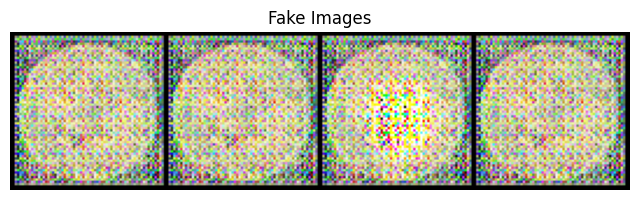

[1251/2000][0/2]	Loss_D: 0.1493	Loss_G: 4.1807	D(x): 0.9875	D(G(z)): 0.1208 / 0.0211
[1252/2000][0/2]	Loss_D: 1.7014	Loss_G: 7.6457	D(x): 0.9927	D(G(z)): 0.7488 / 0.0006
[1253/2000][0/2]	Loss_D: 1.4726	Loss_G: 2.2988	D(x): 0.3163	D(G(z)): 0.0168 / 0.1054
[1254/2000][0/2]	Loss_D: 1.7616	Loss_G: 7.4591	D(x): 0.9679	D(G(z)): 0.6994 / 0.0014
[1255/2000][0/2]	Loss_D: 0.4018	Loss_G: 4.4557	D(x): 0.7198	D(G(z)): 0.0382 / 0.0258
[1256/2000][0/2]	Loss_D: 0.3542	Loss_G: 2.0149	D(x): 0.8105	D(G(z)): 0.1304 / 0.1474
[1257/2000][0/2]	Loss_D: 0.1574	Loss_G: 4.4929	D(x): 0.9998	D(G(z)): 0.1401 / 0.0128
[1258/2000][0/2]	Loss_D: 0.0429	Loss_G: 5.3481	D(x): 0.9692	D(G(z)): 0.0114 / 0.0056
[1259/2000][0/2]	Loss_D: 0.2566	Loss_G: 2.7582	D(x): 0.8052	D(G(z)): 0.0384 / 0.0647
[1260/2000][0/2]	Loss_D: 0.0959	Loss_G: 3.8044	D(x): 0.9994	D(G(z)): 0.0900 / 0.0224
[1261/2000][0/2]	Loss_D: 0.0993	Loss_G: 4.2093	D(x): 0.9959	D(G(z)): 0.0901 / 0.0155
[1262/2000][0/2]	Loss_D: 0.2265	Loss_G: 4.3139	D(x): 0.9977	D(G(z

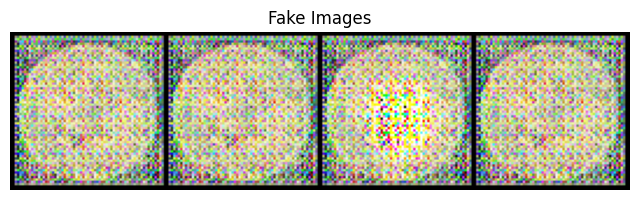

[1301/2000][0/2]	Loss_D: 0.0207	Loss_G: 4.2244	D(x): 0.9981	D(G(z)): 0.0185 / 0.0165
[1302/2000][0/2]	Loss_D: 0.1364	Loss_G: 3.7820	D(x): 0.9981	D(G(z)): 0.1248 / 0.0237
[1303/2000][0/2]	Loss_D: 0.0155	Loss_G: 5.6375	D(x): 0.9914	D(G(z)): 0.0068 / 0.0052
[1304/2000][0/2]	Loss_D: 0.0060	Loss_G: 5.6708	D(x): 0.9995	D(G(z)): 0.0055 / 0.0070
[1305/2000][0/2]	Loss_D: 0.0393	Loss_G: 4.1563	D(x): 0.9997	D(G(z)): 0.0377 / 0.0332
[1306/2000][0/2]	Loss_D: 0.1044	Loss_G: 3.8988	D(x): 0.9933	D(G(z)): 0.0899 / 0.0241
[1307/2000][0/2]	Loss_D: 0.0031	Loss_G: 8.6136	D(x): 0.9973	D(G(z)): 0.0003 / 0.0003
[1308/2000][0/2]	Loss_D: 0.0943	Loss_G: 3.6266	D(x): 0.9958	D(G(z)): 0.0849 / 0.0287
[1309/2000][0/2]	Loss_D: 0.0917	Loss_G: 3.9030	D(x): 0.9903	D(G(z)): 0.0778 / 0.0215
[1310/2000][0/2]	Loss_D: 0.1025	Loss_G: 3.6919	D(x): 0.9903	D(G(z)): 0.0877 / 0.0275
[1311/2000][0/2]	Loss_D: 0.3185	Loss_G: 2.1402	D(x): 0.8172	D(G(z)): 0.0697 / 0.1984
[1312/2000][0/2]	Loss_D: 0.1171	Loss_G: 4.7317	D(x): 0.8985	D(G(z

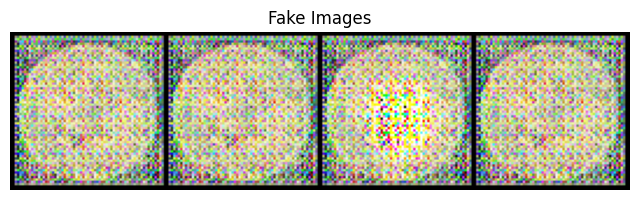

[1351/2000][0/2]	Loss_D: 1.1564	Loss_G: 7.4934	D(x): 0.3643	D(G(z)): 0.0001 / 0.0006
[1352/2000][0/2]	Loss_D: 3.3246	Loss_G: 13.8391	D(x): 0.9959	D(G(z)): 0.9158 / 0.0000
[1353/2000][0/2]	Loss_D: 0.4811	Loss_G: 2.4548	D(x): 0.7010	D(G(z)): 0.0226 / 0.1621
[1354/2000][0/2]	Loss_D: 1.0608	Loss_G: 3.1564	D(x): 0.6289	D(G(z)): 0.0731 / 0.0756
[1355/2000][0/2]	Loss_D: 0.1090	Loss_G: 3.7616	D(x): 0.9323	D(G(z)): 0.0374 / 0.0317
[1356/2000][0/2]	Loss_D: 0.4027	Loss_G: 3.9416	D(x): 0.8670	D(G(z)): 0.2185 / 0.0351
[1357/2000][0/2]	Loss_D: 0.0947	Loss_G: 3.9906	D(x): 0.9471	D(G(z)): 0.0380 / 0.0202
[1358/2000][0/2]	Loss_D: 0.1319	Loss_G: 3.5967	D(x): 0.9280	D(G(z)): 0.0541 / 0.0297
[1359/2000][0/2]	Loss_D: 0.1882	Loss_G: 4.6727	D(x): 0.9940	D(G(z)): 0.1617 / 0.0109
[1360/2000][0/2]	Loss_D: 0.3091	Loss_G: 4.5802	D(x): 0.9888	D(G(z)): 0.2299 / 0.0139
[1361/2000][0/2]	Loss_D: 0.6508	Loss_G: 3.5596	D(x): 0.8020	D(G(z)): 0.2548 / 0.0468
[1362/2000][0/2]	Loss_D: 0.8876	Loss_G: 5.8261	D(x): 0.9857	D(G(

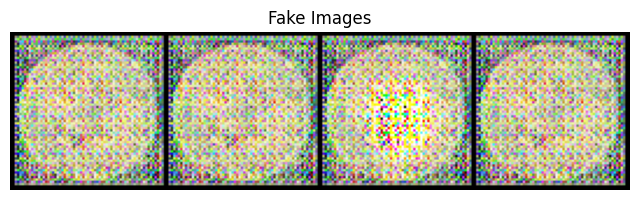

[1401/2000][0/2]	Loss_D: 0.1064	Loss_G: 3.4019	D(x): 0.9653	D(G(z)): 0.0674 / 0.0343
[1402/2000][0/2]	Loss_D: 0.0316	Loss_G: 4.1726	D(x): 0.9972	D(G(z)): 0.0284 / 0.0155
[1403/2000][0/2]	Loss_D: 0.0345	Loss_G: 3.7607	D(x): 0.9794	D(G(z)): 0.0135 / 0.0596
[1404/2000][0/2]	Loss_D: 0.2498	Loss_G: 5.2580	D(x): 0.8108	D(G(z)): 0.0170 / 0.0064
[1405/2000][0/2]	Loss_D: 0.1380	Loss_G: 3.1125	D(x): 0.9212	D(G(z)): 0.0494 / 0.0474
[1406/2000][0/2]	Loss_D: 0.2821	Loss_G: 3.6365	D(x): 0.9563	D(G(z)): 0.2042 / 0.0289
[1407/2000][0/2]	Loss_D: 0.0118	Loss_G: 6.8088	D(x): 0.9920	D(G(z)): 0.0038 / 0.0026
[1408/2000][0/2]	Loss_D: 0.0072	Loss_G: 5.7472	D(x): 0.9965	D(G(z)): 0.0037 / 0.0060
[1409/2000][0/2]	Loss_D: 0.8432	Loss_G: 5.7517	D(x): 0.5853	D(G(z)): 0.0038 / 0.0064
[1410/2000][0/2]	Loss_D: 0.0085	Loss_G: 6.3540	D(x): 0.9938	D(G(z)): 0.0022 / 0.0021
[1411/2000][0/2]	Loss_D: 0.3042	Loss_G: 3.0975	D(x): 0.9980	D(G(z)): 0.2270 / 0.0524
[1412/2000][0/2]	Loss_D: 0.7175	Loss_G: 4.0450	D(x): 0.5736	D(G(z

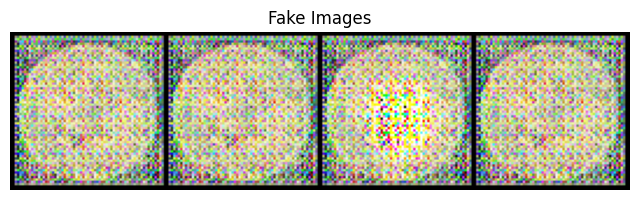

[1451/2000][0/2]	Loss_D: 0.8199	Loss_G: 2.8314	D(x): 0.5984	D(G(z)): 0.0185 / 0.0787
[1452/2000][0/2]	Loss_D: 0.0187	Loss_G: 4.6964	D(x): 0.9926	D(G(z)): 0.0111 / 0.0276
[1453/2000][0/2]	Loss_D: 0.4261	Loss_G: 4.7867	D(x): 0.6836	D(G(z)): 0.0157 / 0.0404
[1454/2000][0/2]	Loss_D: 0.0911	Loss_G: 1.5025	D(x): 0.9995	D(G(z)): 0.0858 / 0.2609
[1455/2000][0/2]	Loss_D: 1.6138	Loss_G: 4.5064	D(x): 0.3638	D(G(z)): 0.0017 / 0.0292
[1456/2000][0/2]	Loss_D: 0.4717	Loss_G: 4.3487	D(x): 0.9981	D(G(z)): 0.3468 / 0.0205
[1457/2000][0/2]	Loss_D: 0.9133	Loss_G: 3.1316	D(x): 0.4291	D(G(z)): 0.0061 / 0.1257
[1458/2000][0/2]	Loss_D: 1.3949	Loss_G: 7.2974	D(x): 0.9938	D(G(z)): 0.6261 / 0.0016
[1459/2000][0/2]	Loss_D: 2.7335	Loss_G: 2.2886	D(x): 0.2925	D(G(z)): 0.0179 / 0.4174
[1460/2000][0/2]	Loss_D: 0.4145	Loss_G: 7.3437	D(x): 0.9977	D(G(z)): 0.2435 / 0.0007
[1461/2000][0/2]	Loss_D: 0.5738	Loss_G: 2.0500	D(x): 0.6650	D(G(z)): 0.0463 / 0.3380
[1462/2000][0/2]	Loss_D: 0.0884	Loss_G: 5.3642	D(x): 0.9998	D(G(z

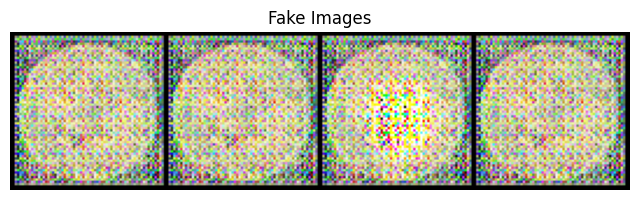

[1501/2000][0/2]	Loss_D: 0.2982	Loss_G: 2.3837	D(x): 0.8632	D(G(z)): 0.1296 / 0.0944
[1502/2000][0/2]	Loss_D: 0.4363	Loss_G: 2.4653	D(x): 0.6788	D(G(z)): 0.0231 / 0.1243
[1503/2000][0/2]	Loss_D: 0.0168	Loss_G: 6.0623	D(x): 0.9890	D(G(z)): 0.0057 / 0.0045
[1504/2000][0/2]	Loss_D: 1.2391	Loss_G: 4.2988	D(x): 0.4324	D(G(z)): 0.0037 / 0.1979
[1505/2000][0/2]	Loss_D: 0.2537	Loss_G: 4.6411	D(x): 0.9987	D(G(z)): 0.2021 / 0.0108
[1506/2000][0/2]	Loss_D: 0.1536	Loss_G: 5.0836	D(x): 0.8949	D(G(z)): 0.0226 / 0.0081
[1507/2000][0/2]	Loss_D: 0.7778	Loss_G: 1.1238	D(x): 0.5187	D(G(z)): 0.0306 / 0.4093
[1508/2000][0/2]	Loss_D: 0.0023	Loss_G: 8.8410	D(x): 0.9996	D(G(z)): 0.0019 / 0.0004
[1509/2000][0/2]	Loss_D: 0.1371	Loss_G: 2.4820	D(x): 0.9998	D(G(z)): 0.1149 / 0.2240
[1510/2000][0/2]	Loss_D: 0.1031	Loss_G: 4.1054	D(x): 0.9973	D(G(z)): 0.0948 / 0.0189
[1511/2000][0/2]	Loss_D: 0.0795	Loss_G: 4.2042	D(x): 0.9966	D(G(z)): 0.0693 / 0.0202
[1512/2000][0/2]	Loss_D: 0.1063	Loss_G: 3.6705	D(x): 0.9997	D(G(z

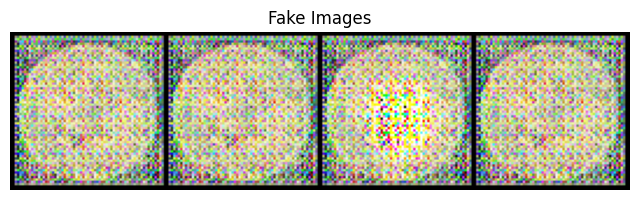

[1551/2000][0/2]	Loss_D: 0.0216	Loss_G: 5.6803	D(x): 0.9845	D(G(z)): 0.0058 / 0.0037
[1552/2000][0/2]	Loss_D: 0.0213	Loss_G: 3.6654	D(x): 0.9993	D(G(z)): 0.0203 / 0.0399
[1553/2000][0/2]	Loss_D: 0.2632	Loss_G: 6.8062	D(x): 0.8170	D(G(z)): 0.0109 / 0.0100
[1554/2000][0/2]	Loss_D: 0.2232	Loss_G: 5.7922	D(x): 0.8162	D(G(z)): 0.0093 / 0.0210
[1555/2000][0/2]	Loss_D: 0.0223	Loss_G: 4.3343	D(x): 0.9999	D(G(z)): 0.0218 / 0.0175
[1556/2000][0/2]	Loss_D: 0.0742	Loss_G: 5.0006	D(x): 0.9387	D(G(z)): 0.0065 / 0.0069
[1557/2000][0/2]	Loss_D: 0.0069	Loss_G: 8.1324	D(x): 0.9977	D(G(z)): 0.0046 / 0.0028
[1558/2000][0/2]	Loss_D: 0.0021	Loss_G: 6.8698	D(x): 0.9998	D(G(z)): 0.0019 / 0.0025
[1559/2000][0/2]	Loss_D: 0.2259	Loss_G: 3.9677	D(x): 0.8259	D(G(z)): 0.0190 / 0.1272
[1560/2000][0/2]	Loss_D: 0.3355	Loss_G: 8.7602	D(x): 0.7368	D(G(z)): 0.0009 / 0.0003
[1561/2000][0/2]	Loss_D: 0.0438	Loss_G: 6.4248	D(x): 0.9607	D(G(z)): 0.0036 / 0.0096
[1562/2000][0/2]	Loss_D: 0.0546	Loss_G: 5.6169	D(x): 0.9667	D(G(z

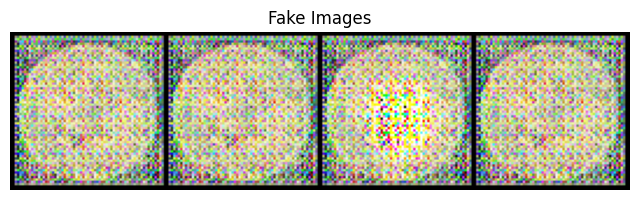

[1601/2000][0/2]	Loss_D: 0.4028	Loss_G: 2.6752	D(x): 0.7290	D(G(z)): 0.0516 / 0.2060
[1602/2000][0/2]	Loss_D: 0.0055	Loss_G: 8.8433	D(x): 0.9992	D(G(z)): 0.0046 / 0.0002
[1603/2000][0/2]	Loss_D: 1.5518	Loss_G: 5.3187	D(x): 0.8040	D(G(z)): 0.5446 / 0.0314
[1604/2000][0/2]	Loss_D: 0.4123	Loss_G: 4.2510	D(x): 0.8108	D(G(z)): 0.0797 / 0.0409
[1605/2000][0/2]	Loss_D: 1.7048	Loss_G: 6.5221	D(x): 0.9957	D(G(z)): 0.7453 / 0.0026
[1606/2000][0/2]	Loss_D: 0.2449	Loss_G: 4.8790	D(x): 0.7968	D(G(z)): 0.0108 / 0.0095
[1607/2000][0/2]	Loss_D: 0.0421	Loss_G: 3.1359	D(x): 0.9993	D(G(z)): 0.0404 / 0.0494
[1608/2000][0/2]	Loss_D: 0.1543	Loss_G: 4.0101	D(x): 0.8788	D(G(z)): 0.0225 / 0.0256
[1609/2000][0/2]	Loss_D: 0.7393	Loss_G: 6.6530	D(x): 0.9998	D(G(z)): 0.5105 / 0.0023
[1610/2000][0/2]	Loss_D: 2.6921	Loss_G: 0.5962	D(x): 0.1425	D(G(z)): 0.0057 / 0.5733
[1611/2000][0/2]	Loss_D: 0.1330	Loss_G: 5.0153	D(x): 0.9690	D(G(z)): 0.0950 / 0.0069
[1612/2000][0/2]	Loss_D: 0.6418	Loss_G: 2.1493	D(x): 0.5789	D(G(z

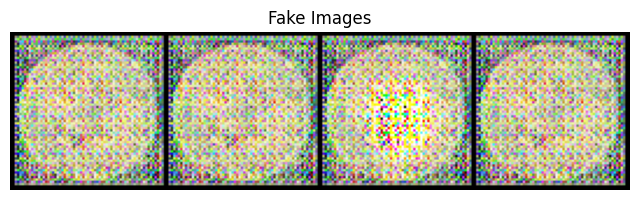

[1651/2000][0/2]	Loss_D: 0.0525	Loss_G: 3.9497	D(x): 0.9973	D(G(z)): 0.0483 / 0.0195
[1652/2000][0/2]	Loss_D: 0.6195	Loss_G: 4.0216	D(x): 0.9856	D(G(z)): 0.4486 / 0.0223
[1653/2000][0/2]	Loss_D: 0.0242	Loss_G: 4.6260	D(x): 0.9977	D(G(z)): 0.0216 / 0.0112
[1654/2000][0/2]	Loss_D: 0.3282	Loss_G: 2.7021	D(x): 0.7789	D(G(z)): 0.0345 / 0.0752
[1655/2000][0/2]	Loss_D: 0.0185	Loss_G: 4.6054	D(x): 0.9998	D(G(z)): 0.0181 / 0.0124
[1656/2000][0/2]	Loss_D: 1.0156	Loss_G: 4.3311	D(x): 0.5020	D(G(z)): 0.0058 / 0.0161
[1657/2000][0/2]	Loss_D: 0.0717	Loss_G: 3.8685	D(x): 0.9971	D(G(z)): 0.0658 / 0.0231
[1658/2000][0/2]	Loss_D: 0.0060	Loss_G: 6.6736	D(x): 0.9967	D(G(z)): 0.0027 / 0.0021
[1659/2000][0/2]	Loss_D: 0.2105	Loss_G: 3.5886	D(x): 0.8616	D(G(z)): 0.0296 / 0.0784
[1660/2000][0/2]	Loss_D: 0.0747	Loss_G: 4.3314	D(x): 0.9623	D(G(z)): 0.0347 / 0.0140
[1661/2000][0/2]	Loss_D: 0.0082	Loss_G: 5.2214	D(x): 0.9999	D(G(z)): 0.0081 / 0.0058
[1662/2000][0/2]	Loss_D: 1.0876	Loss_G: 4.5624	D(x): 1.0000	D(G(z

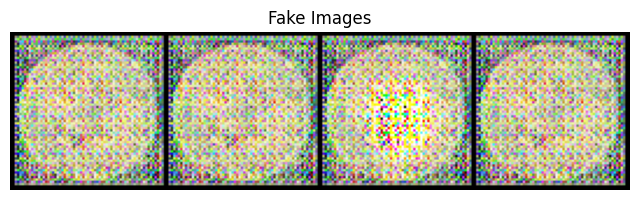

[1701/2000][0/2]	Loss_D: 0.8327	Loss_G: 3.4389	D(x): 0.6230	D(G(z)): 0.0129 / 0.1764
[1702/2000][0/2]	Loss_D: 0.0265	Loss_G: 4.5220	D(x): 0.9998	D(G(z)): 0.0254 / 0.0192
[1703/2000][0/2]	Loss_D: 0.1283	Loss_G: 4.3050	D(x): 0.9914	D(G(z)): 0.1088 / 0.0299
[1704/2000][0/2]	Loss_D: 1.3211	Loss_G: 2.6834	D(x): 0.6466	D(G(z)): 0.0756 / 0.2452
[1705/2000][0/2]	Loss_D: 0.1937	Loss_G: 4.0263	D(x): 0.9981	D(G(z)): 0.1722 / 0.0257
[1706/2000][0/2]	Loss_D: 0.0701	Loss_G: 5.1042	D(x): 0.9747	D(G(z)): 0.0423 / 0.0088
[1707/2000][0/2]	Loss_D: 0.0374	Loss_G: 4.4077	D(x): 0.9911	D(G(z)): 0.0275 / 0.0134
[1708/2000][0/2]	Loss_D: 0.0240	Loss_G: 4.3954	D(x): 0.9988	D(G(z)): 0.0226 / 0.0152
[1709/2000][0/2]	Loss_D: 0.0399	Loss_G: 4.4294	D(x): 0.9891	D(G(z)): 0.0278 / 0.0246
[1710/2000][0/2]	Loss_D: 0.7013	Loss_G: 3.9933	D(x): 0.5639	D(G(z)): 0.0188 / 0.1121
[1711/2000][0/2]	Loss_D: 0.4505	Loss_G: 4.1660	D(x): 0.7301	D(G(z)): 0.0106 / 0.0565
[1712/2000][0/2]	Loss_D: 0.0229	Loss_G: 5.3555	D(x): 0.9991	D(G(z

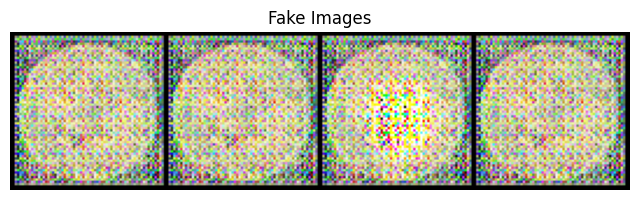

[1751/2000][0/2]	Loss_D: 0.5192	Loss_G: 4.3419	D(x): 0.9682	D(G(z)): 0.3767 / 0.0450
[1752/2000][0/2]	Loss_D: 0.3562	Loss_G: 3.6095	D(x): 0.7317	D(G(z)): 0.0244 / 0.0703
[1753/2000][0/2]	Loss_D: 0.3008	Loss_G: 3.2519	D(x): 0.8781	D(G(z)): 0.1173 / 0.0576
[1754/2000][0/2]	Loss_D: 0.0164	Loss_G: 5.8198	D(x): 0.9983	D(G(z)): 0.0144 / 0.0102
[1755/2000][0/2]	Loss_D: 0.0667	Loss_G: 4.3257	D(x): 0.9675	D(G(z)): 0.0318 / 0.0168
[1756/2000][0/2]	Loss_D: 0.0489	Loss_G: 4.0272	D(x): 0.9967	D(G(z)): 0.0443 / 0.0190
[1757/2000][0/2]	Loss_D: 0.0161	Loss_G: 4.6457	D(x): 0.9995	D(G(z)): 0.0155 / 0.0105
[1758/2000][0/2]	Loss_D: 0.1018	Loss_G: 3.6146	D(x): 0.9884	D(G(z)): 0.0839 / 0.0360
[1759/2000][0/2]	Loss_D: 0.1082	Loss_G: 4.0960	D(x): 0.9981	D(G(z)): 0.1000 / 0.0169
[1760/2000][0/2]	Loss_D: 0.0323	Loss_G: 4.3376	D(x): 0.9985	D(G(z)): 0.0303 / 0.0135
[1761/2000][0/2]	Loss_D: 1.2160	Loss_G: 7.4584	D(x): 0.9994	D(G(z)): 0.6187 / 0.0018
[1762/2000][0/2]	Loss_D: 0.0530	Loss_G: 6.5144	D(x): 0.9689	D(G(z

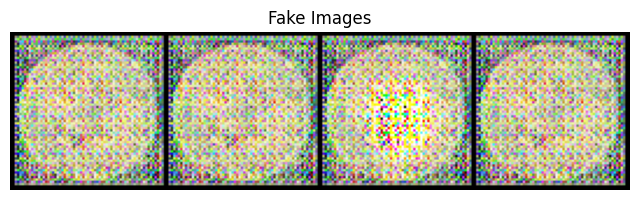

[1801/2000][0/2]	Loss_D: 0.0063	Loss_G: 6.4150	D(x): 0.9990	D(G(z)): 0.0053 / 0.0024
[1802/2000][0/2]	Loss_D: 0.0448	Loss_G: 3.7470	D(x): 0.9883	D(G(z)): 0.0322 / 0.0629
[1803/2000][0/2]	Loss_D: 0.2038	Loss_G: 4.7138	D(x): 1.0000	D(G(z)): 0.1709 / 0.0090
[1804/2000][0/2]	Loss_D: 0.0611	Loss_G: 4.0045	D(x): 0.9993	D(G(z)): 0.0575 / 0.0244
[1805/2000][0/2]	Loss_D: 0.0073	Loss_G: 6.1126	D(x): 0.9993	D(G(z)): 0.0065 / 0.0042
[1806/2000][0/2]	Loss_D: 0.0210	Loss_G: 4.8613	D(x): 0.9990	D(G(z)): 0.0197 / 0.0115
[1807/2000][0/2]	Loss_D: 0.0115	Loss_G: 5.2647	D(x): 0.9964	D(G(z)): 0.0079 / 0.0061
[1808/2000][0/2]	Loss_D: 0.0098	Loss_G: 5.1660	D(x): 0.9996	D(G(z)): 0.0093 / 0.0063
[1809/2000][0/2]	Loss_D: 2.1989	Loss_G: 9.5209	D(x): 0.9994	D(G(z)): 0.8406 / 0.0007
[1810/2000][0/2]	Loss_D: 1.4331	Loss_G: 5.7345	D(x): 0.5207	D(G(z)): 0.0014 / 0.0411
[1811/2000][0/2]	Loss_D: 0.3230	Loss_G: 4.0314	D(x): 0.9791	D(G(z)): 0.2326 / 0.0239
[1812/2000][0/2]	Loss_D: 0.7776	Loss_G: 2.0820	D(x): 0.5679	D(G(z

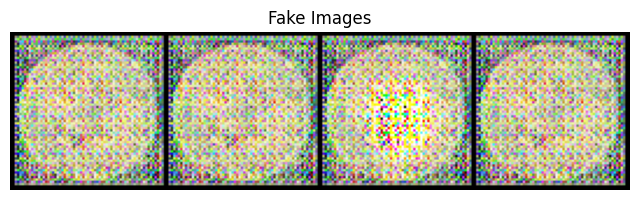

[1851/2000][0/2]	Loss_D: 0.9227	Loss_G: 8.0895	D(x): 0.4884	D(G(z)): 0.0001 / 0.0004
[1852/2000][0/2]	Loss_D: 0.0755	Loss_G: 3.2632	D(x): 0.9535	D(G(z)): 0.0251 / 0.0456
[1853/2000][0/2]	Loss_D: 0.1569	Loss_G: 5.2155	D(x): 0.9987	D(G(z)): 0.1370 / 0.0098
[1854/2000][0/2]	Loss_D: 0.1660	Loss_G: 3.3008	D(x): 0.9490	D(G(z)): 0.1053 / 0.0528
[1855/2000][0/2]	Loss_D: 0.0747	Loss_G: 4.7840	D(x): 0.9991	D(G(z)): 0.0687 / 0.0117
[1856/2000][0/2]	Loss_D: 0.6418	Loss_G: 6.5132	D(x): 0.9994	D(G(z)): 0.4615 / 0.0054
[1857/2000][0/2]	Loss_D: 1.9696	Loss_G: 3.8628	D(x): 0.2815	D(G(z)): 0.0206 / 0.1743
[1858/2000][0/2]	Loss_D: 0.0955	Loss_G: 4.8798	D(x): 0.9912	D(G(z)): 0.0810 / 0.0080
[1859/2000][0/2]	Loss_D: 0.0086	Loss_G: 5.5704	D(x): 0.9991	D(G(z)): 0.0077 / 0.0047
[1860/2000][0/2]	Loss_D: 1.1882	Loss_G: 6.3203	D(x): 0.9996	D(G(z)): 0.6562 / 0.0043
[1861/2000][0/2]	Loss_D: 0.0497	Loss_G: 7.1784	D(x): 0.9593	D(G(z)): 0.0068 / 0.0040
[1862/2000][0/2]	Loss_D: 0.0416	Loss_G: 3.4275	D(x): 0.9998	D(G(z

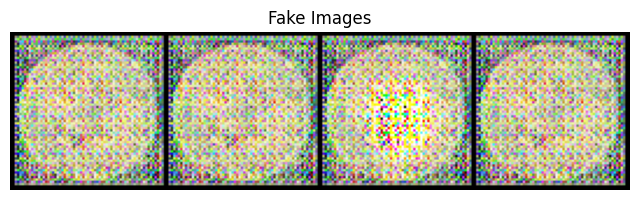

[1901/2000][0/2]	Loss_D: 0.2677	Loss_G: 4.0204	D(x): 0.7883	D(G(z)): 0.0036 / 0.0612
[1902/2000][0/2]	Loss_D: 0.1119	Loss_G: 5.5896	D(x): 0.9980	D(G(z)): 0.1022 / 0.0057
[1903/2000][0/2]	Loss_D: 0.2523	Loss_G: 5.0456	D(x): 0.9823	D(G(z)): 0.1631 / 0.0160
[1904/2000][0/2]	Loss_D: 0.0165	Loss_G: 5.9819	D(x): 0.9972	D(G(z)): 0.0135 / 0.0056
[1905/2000][0/2]	Loss_D: 0.5066	Loss_G: 2.5623	D(x): 0.6677	D(G(z)): 0.0150 / 0.1394
[1906/2000][0/2]	Loss_D: 0.1476	Loss_G: 5.5316	D(x): 0.9998	D(G(z)): 0.1338 / 0.0051
[1907/2000][0/2]	Loss_D: 0.4362	Loss_G: 3.1466	D(x): 0.7201	D(G(z)): 0.0554 / 0.1323
[1908/2000][0/2]	Loss_D: 0.6637	Loss_G: 9.1064	D(x): 0.9987	D(G(z)): 0.4240 / 0.0004
[1909/2000][0/2]	Loss_D: 0.1017	Loss_G: 5.9389	D(x): 0.9173	D(G(z)): 0.0035 / 0.0055
[1910/2000][0/2]	Loss_D: 0.1464	Loss_G: 3.0133	D(x): 0.8982	D(G(z)): 0.0245 / 0.0761
[1911/2000][0/2]	Loss_D: 0.1588	Loss_G: 5.1526	D(x): 0.9976	D(G(z)): 0.1409 / 0.0075
[1912/2000][0/2]	Loss_D: 0.0732	Loss_G: 4.5909	D(x): 0.9459	D(G(z

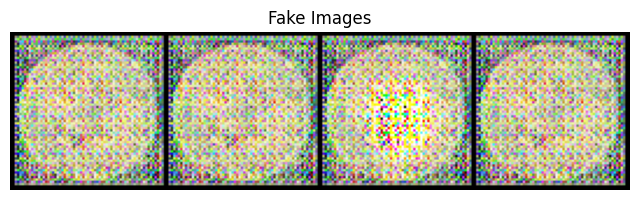

[1951/2000][0/2]	Loss_D: 4.5400	Loss_G: 5.5710	D(x): 0.2398	D(G(z)): 0.0034 / 0.0174
[1952/2000][0/2]	Loss_D: 0.6456	Loss_G: 7.6191	D(x): 0.9994	D(G(z)): 0.4445 / 0.0007
[1953/2000][0/2]	Loss_D: 1.7993	Loss_G: 5.1855	D(x): 0.4047	D(G(z)): 0.0133 / 0.0314
[1954/2000][0/2]	Loss_D: 0.2079	Loss_G: 4.3907	D(x): 0.9611	D(G(z)): 0.1504 / 0.0132
[1955/2000][0/2]	Loss_D: 0.2299	Loss_G: 4.0174	D(x): 0.8431	D(G(z)): 0.0216 / 0.0208
[1956/2000][0/2]	Loss_D: 0.0529	Loss_G: 5.2948	D(x): 0.9965	D(G(z)): 0.0478 / 0.0057
[1957/2000][0/2]	Loss_D: 0.0420	Loss_G: 4.2799	D(x): 0.9985	D(G(z)): 0.0393 / 0.0161
[1958/2000][0/2]	Loss_D: 0.0476	Loss_G: 4.9696	D(x): 0.9596	D(G(z)): 0.0043 / 0.0123
[1959/2000][0/2]	Loss_D: 0.4725	Loss_G: 6.0766	D(x): 0.9992	D(G(z)): 0.3416 / 0.0024
[1960/2000][0/2]	Loss_D: 0.0218	Loss_G: 5.8753	D(x): 0.9866	D(G(z)): 0.0083 / 0.0033
[1961/2000][0/2]	Loss_D: 0.5730	Loss_G: 6.5557	D(x): 0.9987	D(G(z)): 0.3388 / 0.0047
[1962/2000][0/2]	Loss_D: 0.0176	Loss_G: 7.8031	D(x): 0.9980	D(G(z

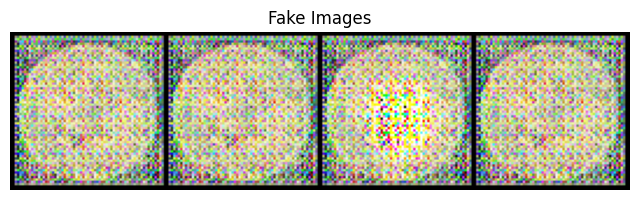

In [11]:
##Training##

# Create batch of latent vectors that I will use to visualize the progression of the generator
viz_noise = noise#torch.randn(BATCH_SIZE, Z_DIM, 1, 1, device=device)

# Initialize BCELoss function
criterion = nn.BCELoss()

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(0.5, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(0.5, 0.999))

# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

if __name__=='__main__':
    print("Starting Training Loop...")
    #netG.load_state_dict(torch.load('/kaggle/input/gan-major-study-weights2000/generator.weight'))#,map_location=torch.device('cpu')
    #netD.load_state_dict(torch.load('/kaggle/input/gan-major-study-weights2000/discriminator.weight'))#,map_location=torch.device('cpu')
    #netG.load_state_dict(torch.load('/kaggle/working/generator.weight'))#,map_location=torch.device('cpu')
    #netD.load_state_dict(torch.load('/kaggle/working/discriminator.weight'))#,map_location=torch.device('cpu')
    flag=0
    for epoch in range(EPOCH_NUM):
        for i, data in enumerate(D_inputs, 0):
            # (1) Update the discriminator with real data
            netD.zero_grad()
            # Format batch
            real_cpu = data.to(device)
            b_size = real_cpu.size(0)
            #print(b_size)

            label = torch.full((b_size,), REAL_LABEL, dtype=torch.float, device=device)
            #print('real_label: ',label.shape)
            
            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            #print(output.shape)

            # Calculate loss on all-real batch
            errD_real = criterion(output, label)
            # Calculate gradients for D in backward pass
            errD_real.backward(retain_graph=True)
            D_x = output.mean().item()

            # (2) Update the discriminator with fake data
            
            # Generate batch of latent vectors
            #noise = torch.randn(b_size, Z_DIM, 1, 1, device=device)
            
            # Generate fake image batch with G
            fake = netG(noise)
            label.fill_(FAKE_LABEL)
            #print('fake_label: ',label.shape)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's loss on the all-fake batch
            errD_fake = criterion(output, label)
            # Calculate the gradients for this batch, accumulated (summed) with previous gradients
            errD_fake.backward(retain_graph=True)
            D_G_z1 = output.mean().item()
            # Compute error of D as sum over the fake and the real batches
            errD = errD_real + errD_fake
            # Update D
            optimizerD.step()

            # (3) Update the generator with fake data
            netG.zero_grad()
            label.fill_(REAL_LABEL)  # fake labels are real for generator cost
            # Since we just updated D, perform another forward pass of all-fake batch through D
            output = netD(fake).view(-1)
            # Calculate G's loss based on this output
            errG = criterion(output, label)
            # Calculate gradients for G
            errG.backward(retain_graph=True)
            D_G_z2 = output.mean().item()
            # Update G
            optimizerG.step()

            # Output training stats
            if i % 50 == 0:
                print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                      % (epoch+1, EPOCH_NUM, i, len(D_inputs),
                         errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
                

            # Save Losses for plotting later
            G_losses.append(errG.item())
            D_losses.append(errD.item())
        
        if ((epoch+1)%5==0):
            avg_G_Loss=sum(G_losses[-5:])/5
            avg_D_Loss=sum(D_losses[-5:])/5
            if avg_G_Loss>=40 or avg_D_Loss>=5:
                print('Exited')
                break
        
        if ((epoch+1)%50==0):
            print("........Saving.......")
            torch.save(netG.state_dict(), '/kaggle/working/generator.weight')
            torch.save(netD.state_dict(), '/kaggle/working/discriminator.weight')
            with torch.no_grad():
                fake = netG(noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            # Plot some fake images
            real_batch = next(iter(img_list))
            plt.figure(figsize=(8,8))
            plt.axis("off")
            plt.title("Fake Images")
            plt.imshow(np.transpose(vutils.make_grid(real_batch.to(device), padding=2, normalize=True).cpu(),(1,2,0)))
            plt.show()

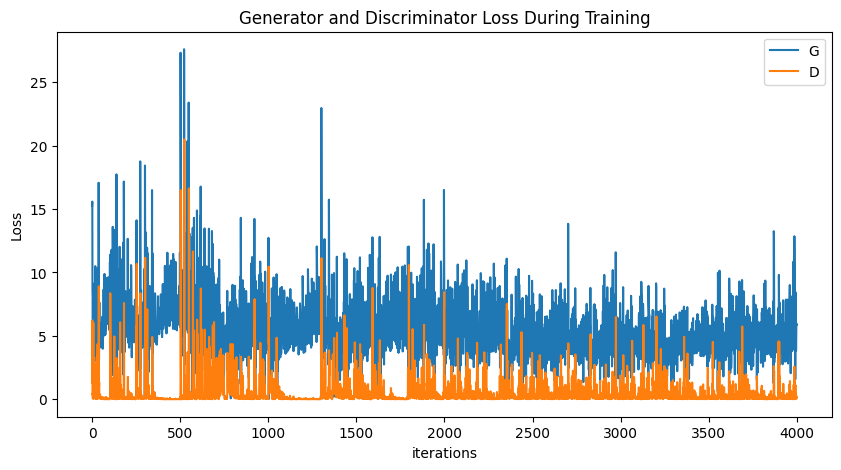

In [12]:
#plot loss graph

plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

torch.Size([4, 100, 1, 1])


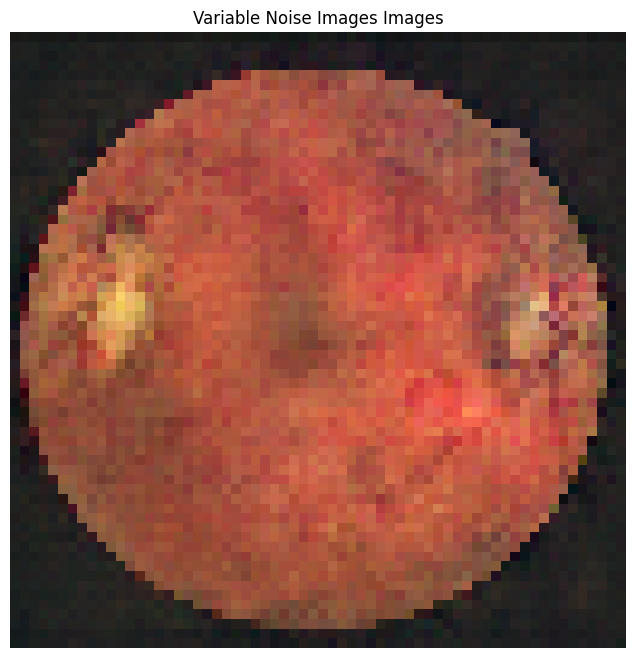

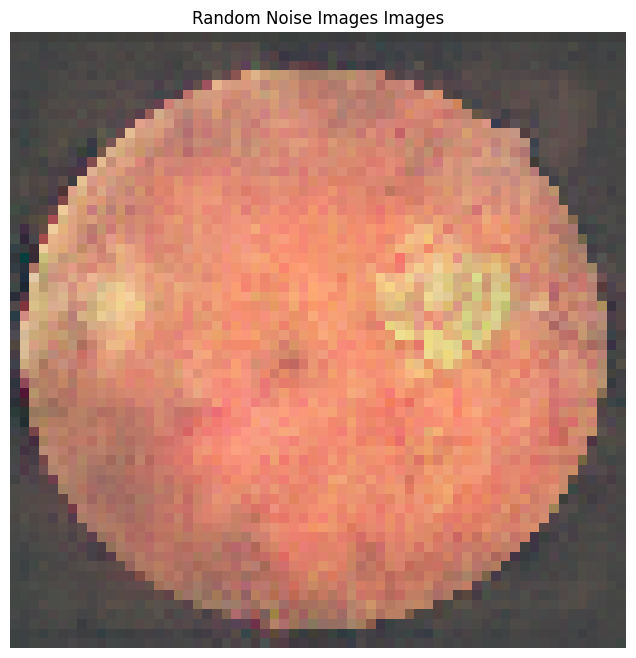

In [13]:
# Generate image

def display_image(dataloader,str):
    # Plot some training images
    Data=dataloader #next(iter(dataloader))
    #print(Data)
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title(f"{str} Images")
    plt.imshow(np.transpose(vutils.make_grid(Data[3],nrow=4, padding=2, normalize=True).cpu(),(1,2,0)))
    plt.show() 
    
if __name__=='__main__':
    netG = generator()
    #netG.load_state_dict(torch.load('/kaggle/input/weights/generator.weight'))#,map_location=torch.device('cpu')
    netG.load_state_dict(torch.load('/kaggle/working/generator.weight'))
    netG.to(device)
    rand_noise = torch.randn(BATCH_SIZE, Z_DIM, 1, 1, device=device)
    
    with torch.no_grad():
        print(noise.shape)
        fake = netG(noise).detach().cpu()
        rand_fake = netG(rand_noise).detach().cpu()
        #print(fake[0].shape)
    
    #Show Training Images
    display_image(fake,'Variable Noise Images')
    display_image(rand_fake,'Random Noise Images')